In [1]:
import sys
import os
import itertools
import pandas as pd
current_dir = os.getcwd()
print(current_dir)

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all


In [2]:
library_path = os.path.join('..', '..', '..','..','UCB-USACE-LSTMs')
sys.path.insert(0, library_path)
print(sys.path)

['../../../../UCB-USACE-LSTMs', '/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all', '/Users/canruso/Desktop', '/Users/canruso/miniforge3/envs/ESDL_LSTM/lib/python310.zip', '/Users/canruso/miniforge3/envs/ESDL_LSTM/lib/python3.10', '/Users/canruso/miniforge3/envs/ESDL_LSTM/lib/python3.10/lib-dynload', '', '/Users/canruso/miniforge3/envs/ESDL_LSTM/lib/python3.10/site-packages', '/Users/canruso/miniforge3/envs/ESDL_LSTM/lib/python3.10/site-packages/setuptools/_vendor']


In [3]:
from pathlib import Path
from neuralhydrology.evaluation.metrics import *
from UCB_training.UCB_train import UCB_trainer
from UCB_training.UCB_utils import combinedPlot
from UCB_training.UCB_utils import fancyCombinedPlot

In [4]:
current_path = os.getcwd()
library_path = current_path.split('UCB-USACE-LSTMs')[0] + 'UCB-USACE-LSTMs'

target_path = os.path.join(library_path, 'UCB_training', 'models', 'warm_springs_all')

if os.path.exists(target_path):
    os.chdir(target_path)
    print("Current Working Directory:", os.getcwd())
    print("Train Basin File Exists:", os.path.exists("warm_springs")) 
else:
    print(f"Error: The target path '{target_path}' does not exist.")

Current Working Directory: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all
Train Basin File Exists: False


In [5]:
path_to_csv = Path(library_path +'/russian_river_data')
path_to_yaml = Path("warm_springs_dam_nlayer.yaml")
path_to_physics_data = Path(library_path + "/russian_river_data/WarmSprings_Inflow_daily.csv")

In [6]:
features_with_physics = [
    #from daily.csv
    "DRY CREEK 20 PRECIP-INC SCREENED",
    "DRY CREEK 20 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "DRY CREEK 30 PRECIP-INC SCREENED",
    "DRY CREEK 30 ET-POTENTIAL RUN:BASIN AVERAGE 60 YR",
    "UKIAH CA HUMIDITY USAF-NOAA",
    "UKIAH CA SOLAR RADIATION USAF-NOAA",
    "UKIAH CA TEMPERATURE USAF-NOAA",
    "UKIAH CA WINDSPEED USAF-NOAA",
    "SANTA ROSA CA HUMIDITY USAF-NOAA",
    "SANTA ROSA CA SOLAR RADIATION USAF-NOAA",
    "SANTA ROSA CA TEMPERATURE USAF-NOAA",
    "SANTA ROSA CA WINDSPEED USAF-NOAA",
    #from Warm_Spring_Inflow.csv
    'Dry Creek 20 ET-POTENTIAL',
    'Dry Creek 20 FLOW',
    'Dry Creek 20 FLOW-BASE',
    'Dry Creek 20 INFILTRATION',
    'Dry Creek 20 PERC-SOIL',
    'Dry Creek 20 SATURATION FRACTION',
    'Dry Creek 30 ET-POTENTIAL',
    'Dry Creek 30 FLOW',
    'Dry Creek 30 FLOW-BASE',
    'Dry Creek 30 INFILTRATION',
    'Dry Creek 30 PERC-SOIL',
    'Dry Creek 30 SATURATION FRACTION',
    'Warm Springs Dam Inflow FLOW',
]

In [7]:
hyperparam_space = {
    "hidden_size": [64, 128, 256],
    "seq_length": [90, 180],
    "num_layers": [1, 2],
    "epochs": [16, 32]
}
fixed_dropout = 0.4
no_physics_results = []
physics_results = []

NoPhysics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 00:57:05,724: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005705/output.log initialized.
2025-02-13 00:57:05,725: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005705
2025-02-13 00:57:05,725: ### Run configurations for testing_run
2025-02-13 00:57:05,725: experiment_name: testing_run
2025-02-13 00:57:05,726: train_basin_file: warm springs
2025-02-13 00:57:05,726: validation_basin_file: warm springs
2025-02-13 00:57:05,726: test_basin_file: warm springs
2025-02-13 00:57:05,726: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:57:05,727: train_end_date: 2002-09-30 00:00:00
2025-02-13 00:57:05,727: validation_start_date: 2002-10-01 00:00:00
2025-02-13 00:57:05,727: validation_end_date: 2005-09-30 00:00

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  4.08it/s]
2025-02-13 00:57:21,770: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005705/validation/model_epoch016/validation_metrics.csv
2025-02-13 00:57:21,771: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005705/validation/model_epoch016/validation_results.p
got predictions


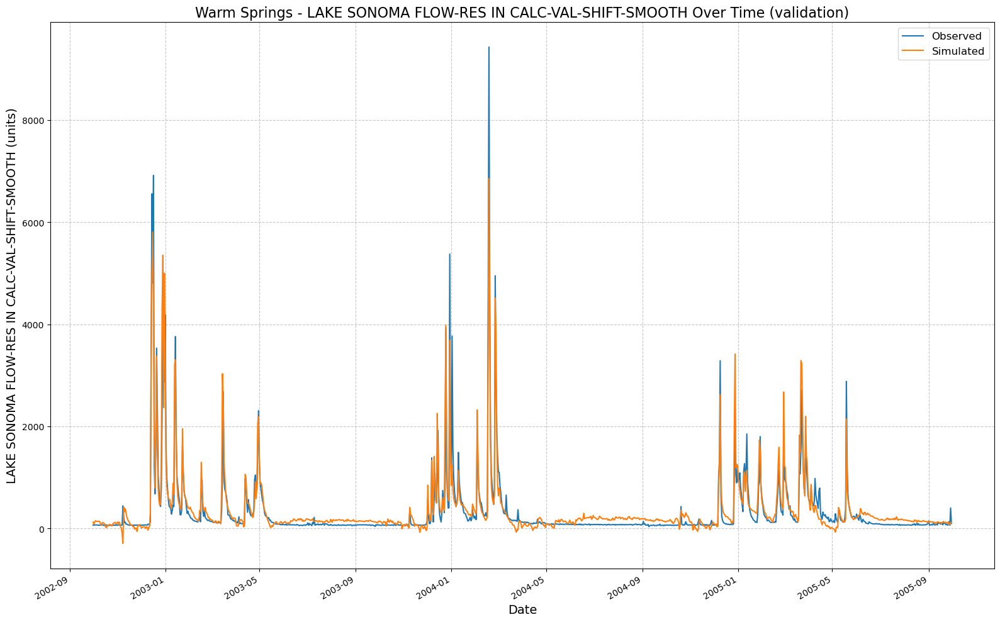

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005705/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 00:57:22,009: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005722/output.log initialized.
2025-02-13 00:57:22,010: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005722
2025-02-13 00:57:22,010: ### Run configurations for testing_run
2025-02-13 00:57:22,010: experiment_name: testing_run
2025-02-13 00:57:22,011: train_basin_file: warm springs
2025-02-13 00:57:22,011: validation_basin_file: warm springs
2025-02-13 00:57:22,012: test_basin_file: warm springs
2025-02-13 00:57:22,012: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:57:22,012: tra

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.63it/s]
2025-02-13 00:57:22,124: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1036.14it/s]
2025-02-13 00:57:22,129: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:00<00:00, 17.43it/s, Loss: 0.0000]
2025-02-13 00:57:22,960: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:00<00:00, 16.35it/s, Loss: 0.0000]
2025-02-13 00:57:23,696: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:00<00:00, 15.34it/s, Loss: 0.0000]
2025-02-13 00:57:24,481: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:00<00:00, 15.07it/s, Loss: 0.0000]
2025-02-13 00:57:25,279: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:00<00:00, 16.88it/s, Loss: 0.0000]
2025-02-13 00:57:25,992: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]
2025-02-13 00:57:50,300: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005722/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:57:50,301: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005722/validation/model_epoch032/validation_results.p
got predictions


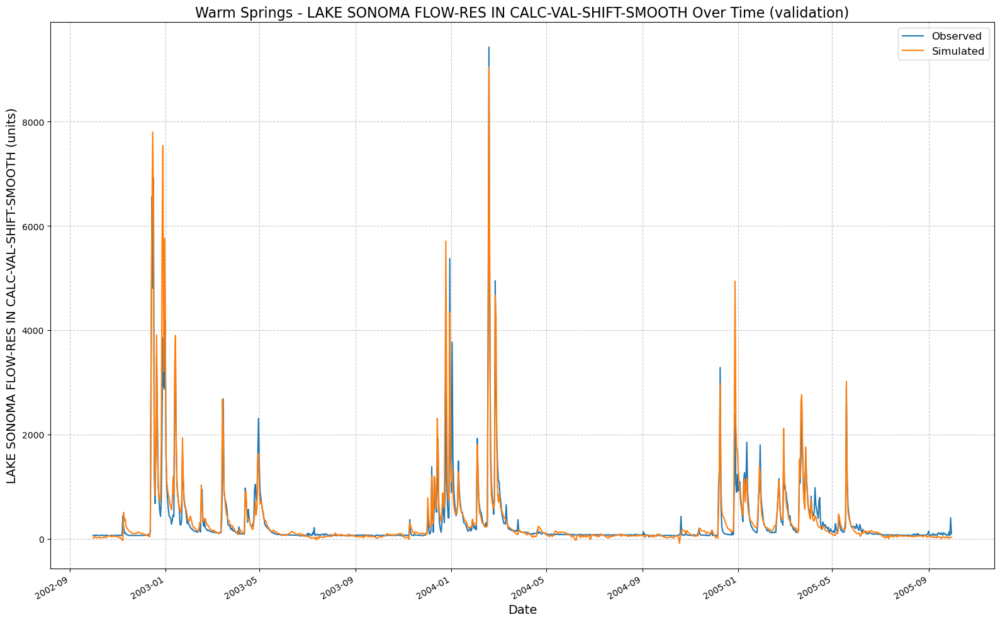

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005722/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 00:57:50,538: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005750/output.log initialized.
2025-02-13 00:57:50,539: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005750
2025-02-13 00:57:50,539: ### Run configurations for testing_run
2025-02-13 00:57:50,540: experiment_name: testing_run
2025-02-13 00:57:50,540: train_basin_file: warm springs
2025-02-13 00:57:50,540: validation_basin_file: warm springs
2025-02-13 00:57:50,541: test_basin_file: warm springs
2025-02-13 00:57:50,541: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:57:50,542: tra

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  9.04it/s]
2025-02-13 00:57:50,671: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1137.59it/s]
2025-02-13 00:57:50,677: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:00<00:00, 12.52it/s, Loss: 0.0000]
2025-02-13 00:57:51,796: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:00<00:00, 15.21it/s, Loss: 0.0000]
2025-02-13 00:57:52,587: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:00<00:00, 15.87it/s, Loss: 0.0000]
2025-02-13 00:57:53,346: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:00<00:00, 14.74it/s, Loss: 0.0000]
2025-02-13 00:57:54,162: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:00<00:00, 12.62it/s, Loss: 0.0000]
2025-02-13 00:57:55,116: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.68it/s]
2025-02-13 00:58:05,877: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005750/validation/model_epoch016/validation_metrics.csv
2025-02-13 00:58:05,879: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005750/validation/model_epoch016/validation_results.p
got predictions


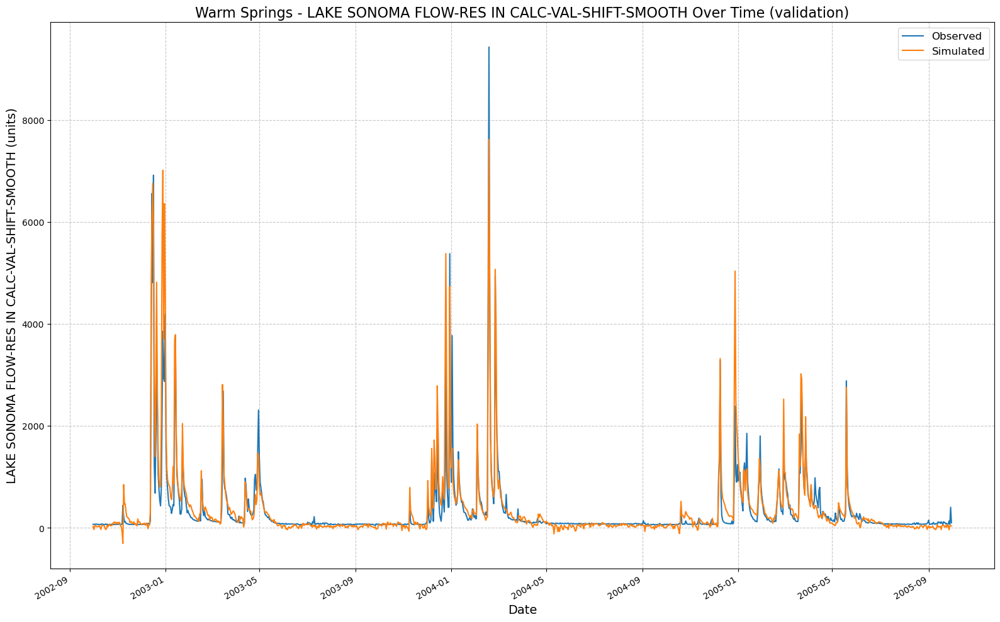

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005750/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 00:58:06,111: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005806/output.log initialized.
2025-02-13 00:58:06,112: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005806
2025-02-13 00:58:06,112: ### Run configurations for testing_run
2025-02-13 00:58:06,113: experiment_name: testing_run
2025-02-13 00:58:06,113: train_basin_file: warm springs
2025-02-13 00:58:06,113: validation_basin_file: warm springs
2025-02-13 00:58:06,114: test_basin_file: warm springs
2025-02-13 00:58:06,114: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:58:06,115: tra

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.73it/s]
2025-02-13 00:58:06,224: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1329.84it/s]
2025-02-13 00:58:06,228: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:00<00:00, 14.14it/s, Loss: 0.0000]
2025-02-13 00:58:07,211: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:00<00:00, 14.24it/s, Loss: 0.0000]
2025-02-13 00:58:08,055: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:00<00:00, 14.31it/s, Loss: 0.0000]
2025-02-13 00:58:08,896: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:00<00:00, 14.36it/s, Loss: 0.0000]
2025-02-13 00:58:09,734: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:00<00:00, 14.52it/s, Loss: 0.0000]
2025-02-13 00:58:10,563: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]
2025-02-13 00:58:35,390: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005806/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:58:35,391: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005806/validation/model_epoch032/validation_results.p
got predictions


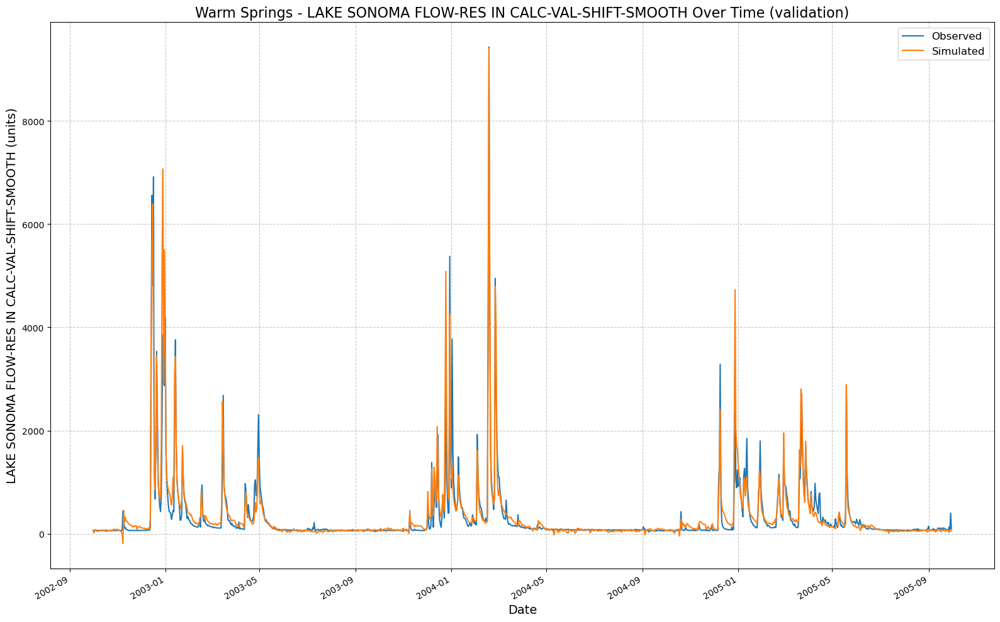

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005806/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 00:58:35,861: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005835/output.log initialized.
2025-02-13 00:58:35,862: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005835
2025-02-13 00:58:35,862: ### Run configurations for testing_run
2025-02-13 00:58:35,862: experiment_name: testing_run
2025-02-13 00:58:35,863: train_basin_file: warm springs
2025-02-13 00:58:35,863: validation_basin_file: warm springs
2025-02-13 00:58:35,863: test_basin_file: warm springs
2025-02-13 00:58:35,864: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:58:35,864: tr

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  9.64it/s]
2025-02-13 00:58:35,985: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1459.90it/s]
2025-02-13 00:58:35,990: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  6.78it/s, Loss: 0.0000]
2025-02-13 00:58:37,791: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  8.13it/s, Loss: 0.0000]
2025-02-13 00:58:39,149: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.11it/s, Loss: 0.0000]
2025-02-13 00:58:40,509: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  8.10it/s, Loss: 0.0000]
2025-02-13 00:58:41,870: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  8.07it/s, Loss: 0.0000]
2025-02-13 00:58:43,236: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.63it/s]
2025-02-13 00:59:00,483: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005835/validation/model_epoch016/validation_metrics.csv
2025-02-13 00:59:00,484: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005835/validation/model_epoch016/validation_results.p
got predictions


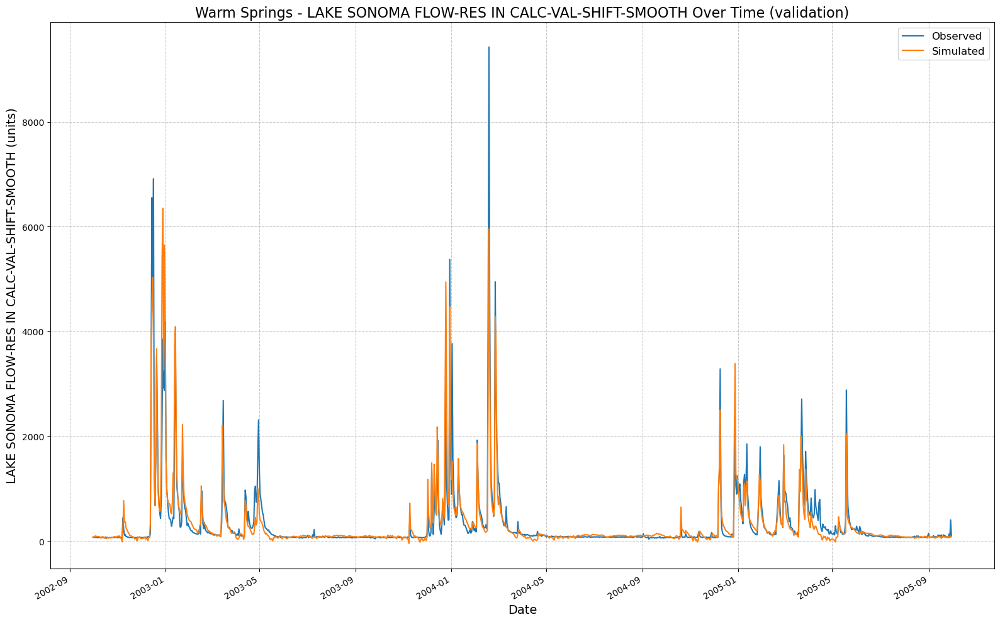

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005835/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 00:59:00,730: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005900/output.log initialized.
2025-02-13 00:59:00,730: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005900
2025-02-13 00:59:00,731: ### Run configurations for testing_run
2025-02-13 00:59:00,731: experiment_name: testing_run
2025-02-13 00:59:00,731: train_basin_file: warm springs
2025-02-13 00:59:00,732: validation_basin_file: warm springs
2025-02-13 00:59:00,732: test_basin_file: warm springs
2025-02-13 00:59:00,732: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:59:00,733: tr

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  9.95it/s]
2025-02-13 00:59:00,850: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1240.92it/s]
2025-02-13 00:59:00,855: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  8.09it/s, Loss: 0.0000]
2025-02-13 00:59:02,357: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  8.09it/s, Loss: 0.0000]
2025-02-13 00:59:03,721: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  8.13it/s, Loss: 0.0000]
2025-02-13 00:59:05,077: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  8.08it/s, Loss: 0.0000]
2025-02-13 00:59:06,441: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  7.74it/s, Loss: 0.0000]
2025-02-13 00:59:07,865: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.58it/s]
2025-02-13 00:59:50,367: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005900/validation/model_epoch032/validation_metrics.csv
2025-02-13 00:59:50,368: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005900/validation/model_epoch032/validation_results.p
got predictions


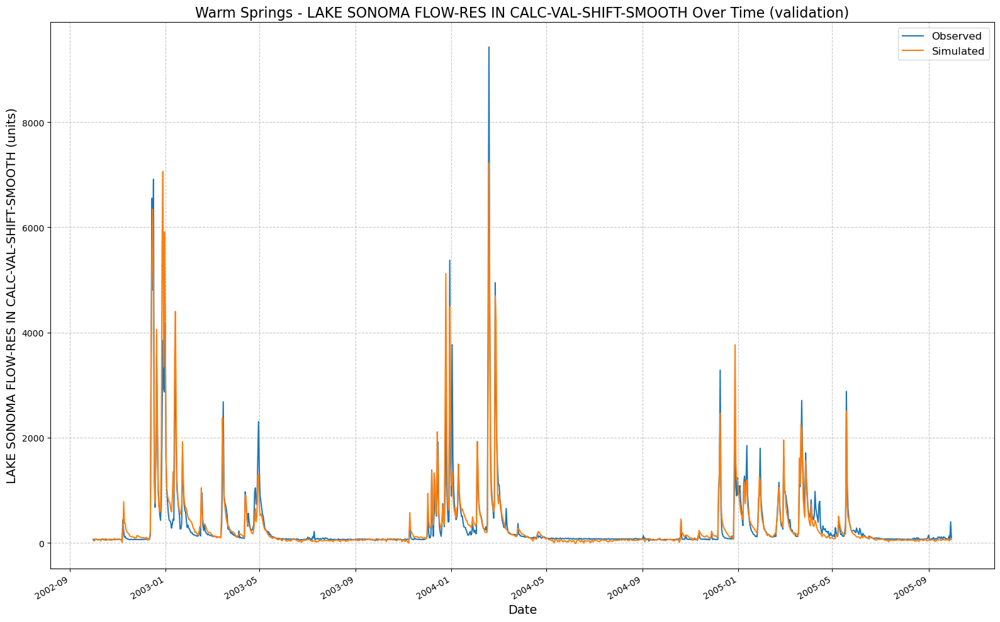

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005900/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 00:59:50,598: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005950/output.log initialized.
2025-02-13 00:59:50,598: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005950
2025-02-13 00:59:50,599: ### Run configurations for testing_run
2025-02-13 00:59:50,599: experiment_name: testing_run
2025-02-13 00:59:50,600: train_basin_file: warm springs
2025-02-13 00:59:50,600: validation_basin_file: warm springs
2025-02-13 00:59:50,601: test_basin_file: warm springs
2025-02-13 00:59:50,601: train_start_date: 1994-10-01 00:00:00
2025-02-13 00:59:50,601: tr

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.84it/s]
2025-02-13 00:59:50,712: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1050.41it/s]
2025-02-13 00:59:50,716: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.38it/s, Loss: 0.0000]
2025-02-13 00:59:52,352: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  8.48it/s, Loss: 0.0000]
2025-02-13 00:59:53,653: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.11it/s, Loss: 0.0000]
2025-02-13 00:59:55,202: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  8.08it/s, Loss: 0.0000]
2025-02-13 00:59:56,567: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  6.80it/s, Loss: 0.0000]
2025-02-13 00:59:58,189: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.45it/s]
2025-02-13 01:00:16,638: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005950/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:00:16,640: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005950/validation/model_epoch016/validation_results.p
got predictions


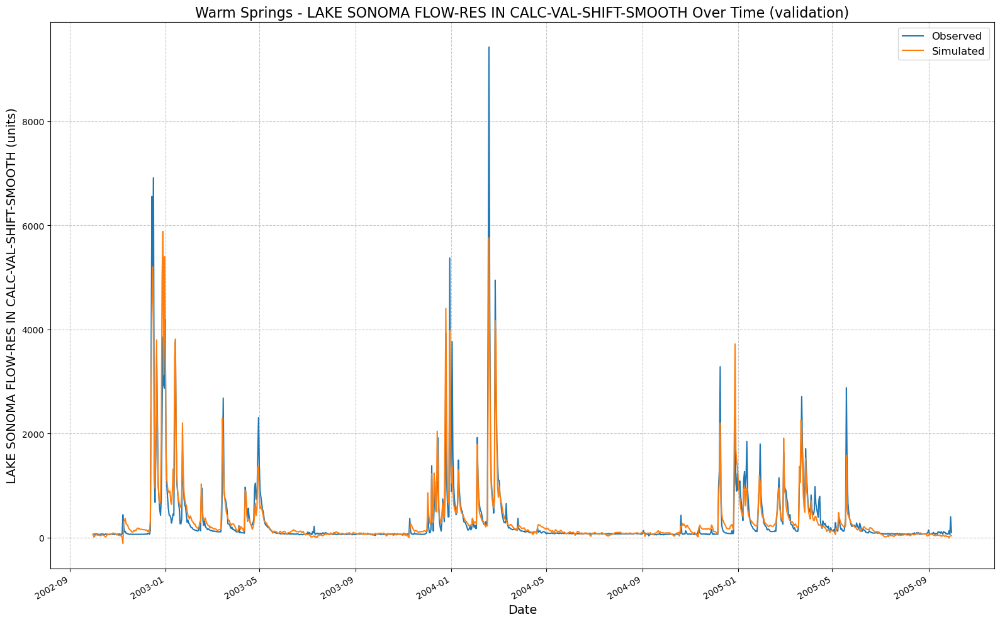

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_005950/results_output_validation.csv
NoPhysics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:00:16,870: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010016/output.log initialized.
2025-02-13 01:00:16,870: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010016
2025-02-13 01:00:16,870: ### Run configurations for testing_run
2025-02-13 01:00:16,871: experiment_name: testing_run
2025-02-13 01:00:16,871: train_basin_file: warm springs
2025-02-13 01:00:16,872: validation_basin_file: warm springs
2025-02-13 01:00:16,872: test_basin_file: warm springs
2025-02-13 01:00:16,872: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:00:16,872: tr

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  9.10it/s]
2025-02-13 01:00:17,006: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1428.58it/s]
2025-02-13 01:00:17,012: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  6.89it/s, Loss: 0.0000]
2025-02-13 01:00:18,775: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  7.42it/s, Loss: 0.0000]
2025-02-13 01:00:20,261: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.30it/s, Loss: 0.0000]
2025-02-13 01:00:21,771: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.93it/s, Loss: 0.0000]
2025-02-13 01:00:23,160: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  7.55it/s, Loss: 0.0000]
2025-02-13 01:00:24,620: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.56it/s]
2025-02-13 01:01:07,810: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010016/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:01:07,811: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010016/validation/model_epoch032/validation_results.p
got predictions


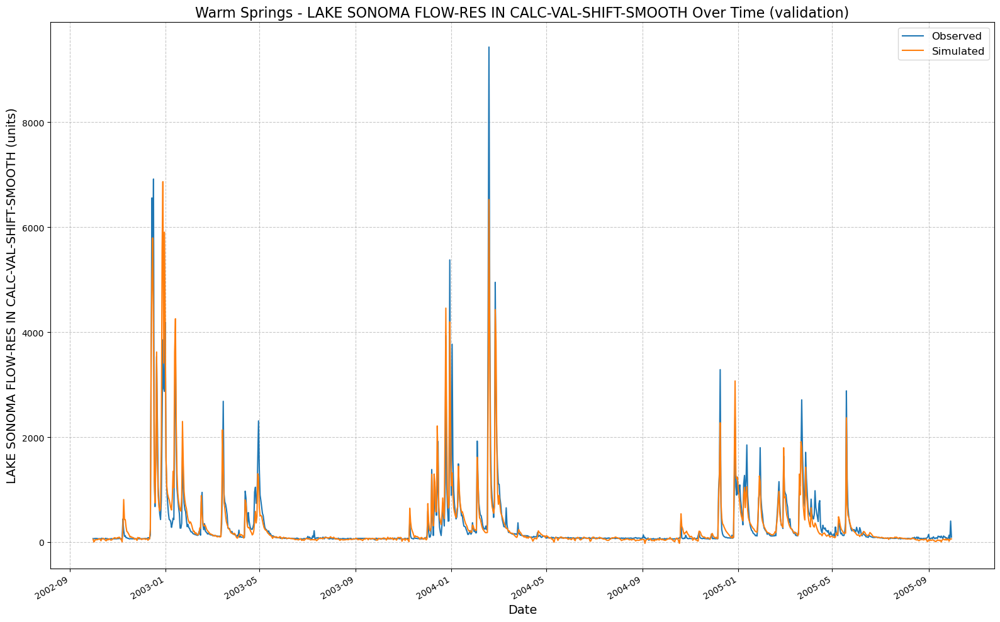

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010016/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:01:08,049: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010108/output.log initialized.
2025-02-13 01:01:08,049: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010108
2025-02-13 01:01:08,050: ### Run configurations for testing_run
2025-02-13 01:01:08,050: experiment_name: testing_run
2025-02-13 01:01:08,051: train_basin_file: warm springs
2025-02-13 01:01:08,051: validation_basin_file: warm springs
2025-02-13 01:01:08,052: test_basin_file: warm springs
2025-02-13 01:01:08,052: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:01:08,053: tr

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  9.03it/s]
2025-02-13 01:01:08,187: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1235.80it/s]
2025-02-13 01:01:08,194: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:01<00:00,  8.23it/s, Loss: 0.0000]
2025-02-13 01:01:09,816: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:01<00:00,  8.74it/s, Loss: 0.0000]
2025-02-13 01:01:11,192: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:01<00:00,  8.49it/s, Loss: 0.0000]
2025-02-13 01:01:12,608: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:01<00:00,  8.54it/s, Loss: 0.0000]
2025-02-13 01:01:14,016: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:01<00:00,  8.62it/s, Loss: 0.0000]
2025-02-13 01:01:15,410: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.64it/s]
2025-02-13 01:01:32,391: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010108/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:01:32,392: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010108/validation/model_epoch016/validation_results.p
got predictions


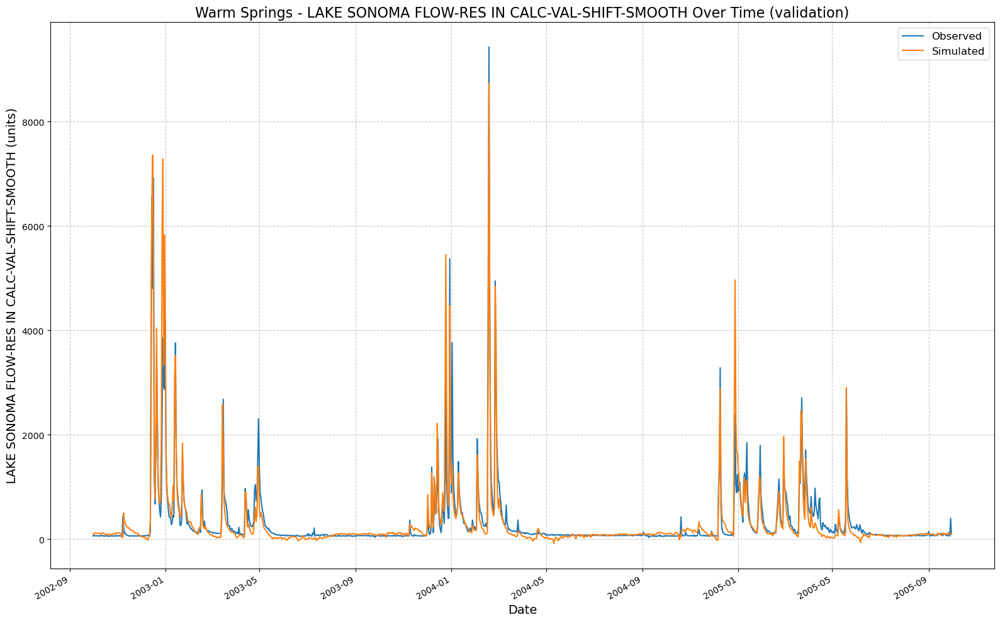

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010108/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:01:32,620: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010132/output.log initialized.
2025-02-13 01:01:32,621: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010132
2025-02-13 01:01:32,621: ### Run configurations for testing_run
2025-02-13 01:01:32,622: experiment_name: testing_run
2025-02-13 01:01:32,622: train_basin_file: warm springs
2025-02-13 01:01:32,622: validation_basin_file: warm springs
2025-02-13 01:01:32,623: test_basin_file: warm springs
2025-02-13 01:01:32,623: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:01:32,624: tr

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.13it/s]
2025-02-13 01:01:32,740: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1117.59it/s]
2025-02-13 01:01:32,745: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:01<00:00,  7.47it/s, Loss: 0.0000]
2025-02-13 01:01:34,493: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:01<00:00,  8.53it/s, Loss: 0.0000]
2025-02-13 01:01:35,902: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:01<00:00,  8.54it/s, Loss: 0.0000]
2025-02-13 01:01:37,309: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:01<00:00,  8.39it/s, Loss: 0.0000]
2025-02-13 01:01:38,742: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:01<00:00,  8.31it/s, Loss: 0.0000]
2025-02-13 01:01:40,188: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.37it/s]
2025-02-13 01:02:20,929: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010132/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:02:20,930: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010132/validation/model_epoch032/validation_results.p
got predictions


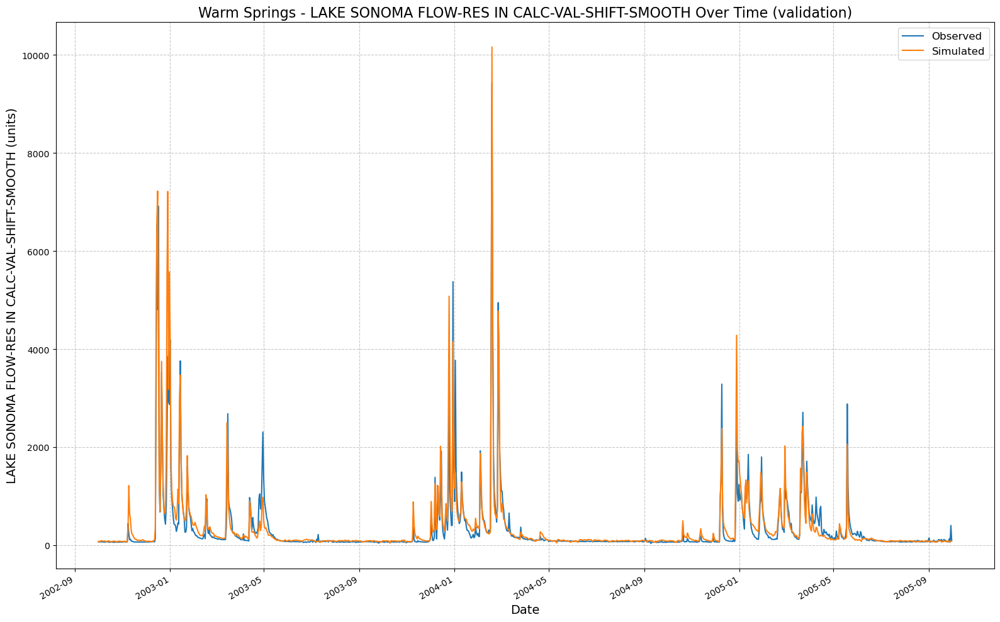

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010132/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:02:21,173: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010221/output.log initialized.
2025-02-13 01:02:21,174: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010221
2025-02-13 01:02:21,174: ### Run configurations for testing_run
2025-02-13 01:02:21,174: experiment_name: testing_run
2025-02-13 01:02:21,175: train_basin_file: warm springs
2025-02-13 01:02:21,175: validation_basin_file: warm springs
2025-02-13 01:02:21,175: test_basin_file: warm springs
2025-02-13 01:02:21,176: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:02:21,176: tr

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.03it/s]
2025-02-13 01:02:21,294: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1101.45it/s]
2025-02-13 01:02:21,299: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:01<00:00,  8.51it/s, Loss: 0.0000]
2025-02-13 01:02:22,869: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:01<00:00,  8.97it/s, Loss: 0.0000]
2025-02-13 01:02:24,211: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:01<00:00,  8.85it/s, Loss: 0.0000]
2025-02-13 01:02:25,570: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:01<00:00,  8.87it/s, Loss: 0.0000]
2025-02-13 01:02:26,924: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:01<00:00,  9.11it/s, Loss: 0.0000]
2025-02-13 01:02:28,244: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.48it/s]
2025-02-13 01:02:44,914: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010221/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:02:44,915: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010221/validation/model_epoch016/validation_results.p
got predictions


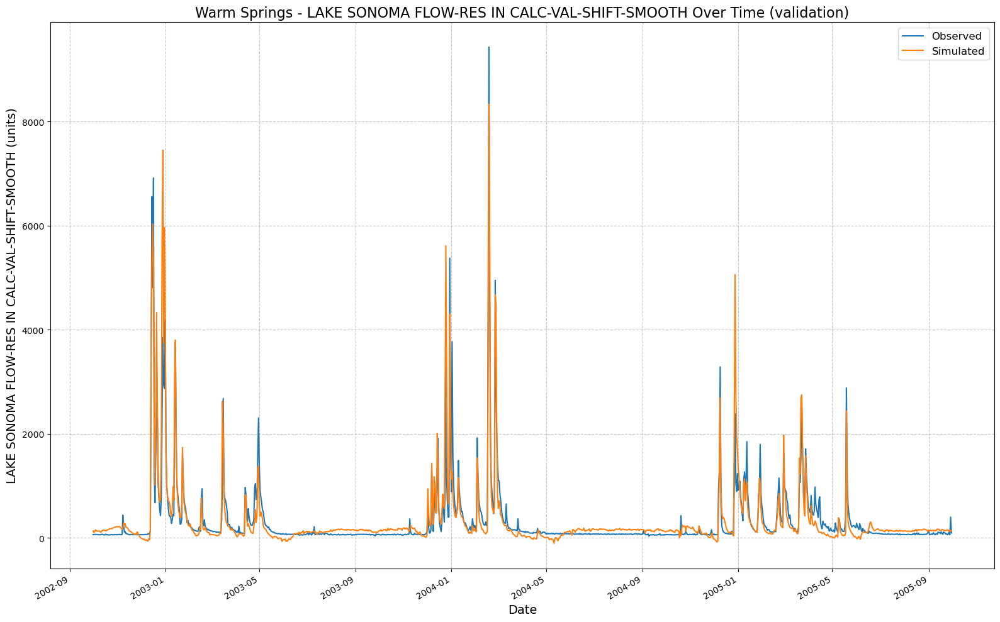

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010221/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:02:45,164: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010245/output.log initialized.
2025-02-13 01:02:45,164: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010245
2025-02-13 01:02:45,165: ### Run configurations for testing_run
2025-02-13 01:02:45,165: experiment_name: testing_run
2025-02-13 01:02:45,165: train_basin_file: warm springs
2025-02-13 01:02:45,166: validation_basin_file: warm springs
2025-02-13 01:02:45,166: test_basin_file: warm springs
2025-02-13 01:02:45,166: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:02:45,167: tr

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.27it/s]
2025-02-13 01:02:45,326: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 570.81it/s]
2025-02-13 01:02:45,335: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:01<00:00,  7.85it/s, Loss: 0.0000]
2025-02-13 01:02:47,034: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:01<00:00,  8.87it/s, Loss: 0.0000]
2025-02-13 01:02:48,390: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:01<00:00,  9.01it/s, Loss: 0.0000]
2025-02-13 01:02:49,724: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:01<00:00,  9.12it/s, Loss: 0.0000]
2025-02-13 01:02:51,043: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:01<00:00,  8.91it/s, Loss: 0.0000]
2025-02-13 01:02:52,393: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]
2025-02-13 01:03:34,012: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010245/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:03:34,014: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010245/validation/model_epoch032/validation_results.p
got predictions


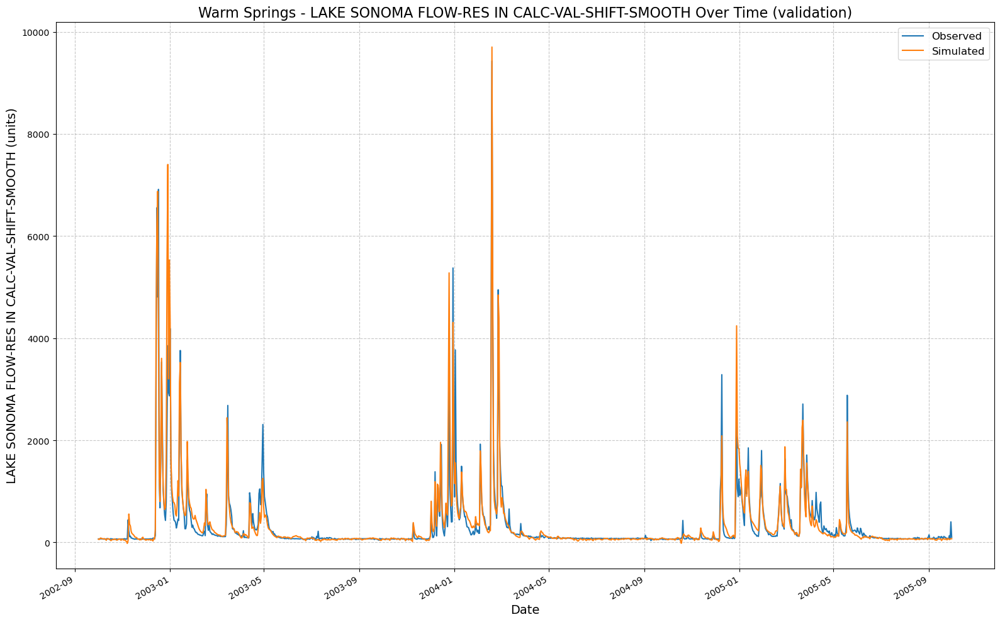

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010245/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:03:34,250: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010334/output.log initialized.
2025-02-13 01:03:34,250: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010334
2025-02-13 01:03:34,251: ### Run configurations for testing_run
2025-02-13 01:03:34,251: experiment_name: testing_run
2025-02-13 01:03:34,251: train_basin_file: warm springs
2025-02-13 01:03:34,252: validation_basin_file: warm springs
2025-02-13 01:03:34,252: test_basin_file: warm springs
2025-02-13 01:03:34,253: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:03:34,253: t

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.94it/s]
2025-02-13 01:03:34,363: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1190.21it/s]
2025-02-13 01:03:34,367: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.19it/s, Loss: 0.0000]
2025-02-13 01:03:37,140: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.29it/s, Loss: 0.0000]
2025-02-13 01:03:39,709: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.26it/s, Loss: 0.0000]
2025-02-13 01:03:42,297: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.24it/s, Loss: 0.0000]
2025-02-13 01:03:44,899: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.29it/s, Loss: 0.0000]
2025-02-13 01:03:47,466: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.55it/s]
2025-02-13 01:04:18,233: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010334/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:04:18,234: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010334/validation/model_epoch016/validation_results.p
got predictions


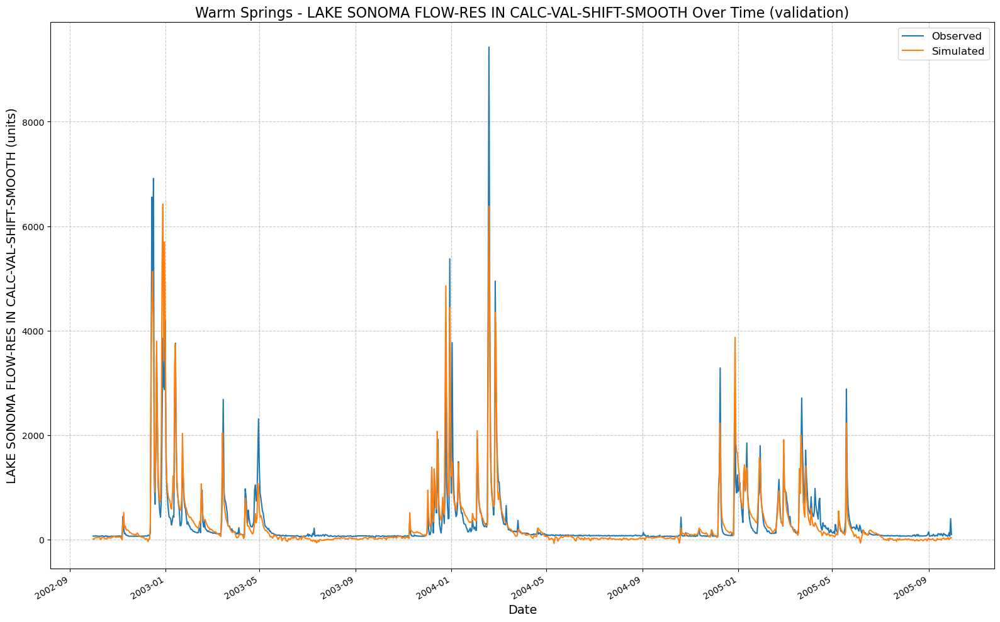

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010334/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:04:18,466: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010418/output.log initialized.
2025-02-13 01:04:18,467: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010418
2025-02-13 01:04:18,467: ### Run configurations for testing_run
2025-02-13 01:04:18,468: experiment_name: testing_run
2025-02-13 01:04:18,468: train_basin_file: warm springs
2025-02-13 01:04:18,469: validation_basin_file: warm springs
2025-02-13 01:04:18,469: test_basin_file: warm springs
2025-02-13 01:04:18,470: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:04:18,470: t

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.90it/s]
2025-02-13 01:04:18,629: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 937.27it/s]
2025-02-13 01:04:18,635: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.08it/s, Loss: 0.0000]
2025-02-13 01:04:21,493: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.48it/s, Loss: 0.0000]
2025-02-13 01:04:23,954: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.38it/s, Loss: 0.0000]
2025-02-13 01:04:26,466: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.21it/s, Loss: 0.0000]
2025-02-13 01:04:29,082: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.29it/s, Loss: 0.0000]
2025-02-13 01:04:31,647: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.46it/s]
2025-02-13 01:05:46,560: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010418/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:05:46,561: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010418/validation/model_epoch032/validation_results.p
got predictions


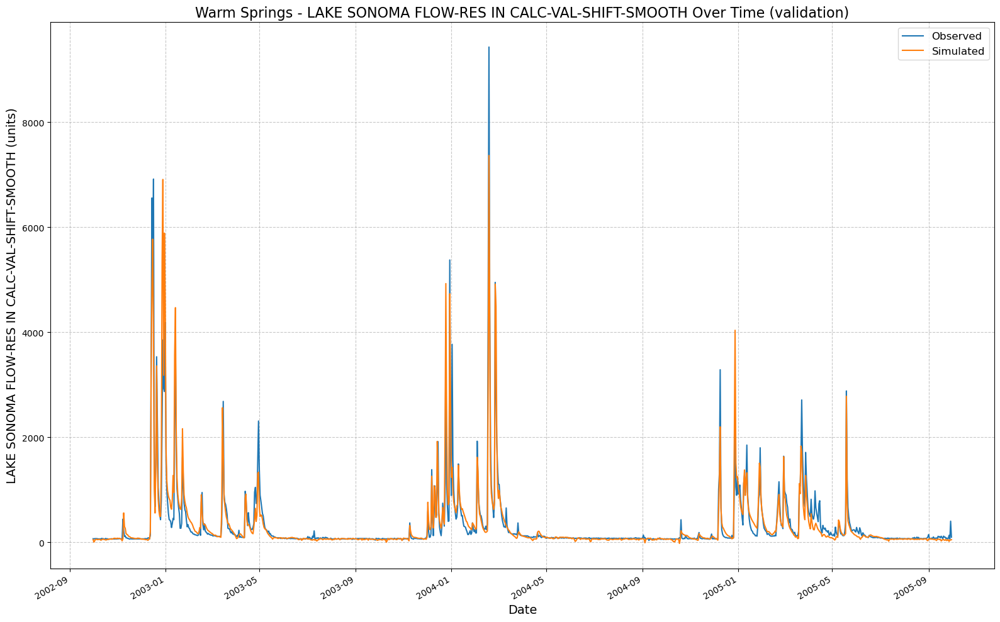

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010418/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:05:46,792: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010546/output.log initialized.
2025-02-13 01:05:46,792: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010546
2025-02-13 01:05:46,793: ### Run configurations for testing_run
2025-02-13 01:05:46,793: experiment_name: testing_run
2025-02-13 01:05:46,793: train_basin_file: warm springs
2025-02-13 01:05:46,794: validation_basin_file: warm springs
2025-02-13 01:05:46,794: test_basin_file: warm springs
2025-02-13 01:05:46,795: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:05:46,795: t

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 11.07it/s]
2025-02-13 01:05:46,903: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1391.15it/s]
2025-02-13 01:05:46,908: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.17it/s, Loss: 0.0000]
2025-02-13 01:05:49,699: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.11it/s, Loss: 0.0000]
2025-02-13 01:05:52,379: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.35it/s, Loss: 0.0000]
2025-02-13 01:05:54,914: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.30it/s, Loss: 0.0000]
2025-02-13 01:05:57,475: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.21it/s, Loss: 0.0000]
2025-02-13 01:06:00,088: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.32it/s]
2025-02-13 01:06:31,349: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010546/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:06:31,349: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010546/validation/model_epoch016/validation_results.p
got predictions


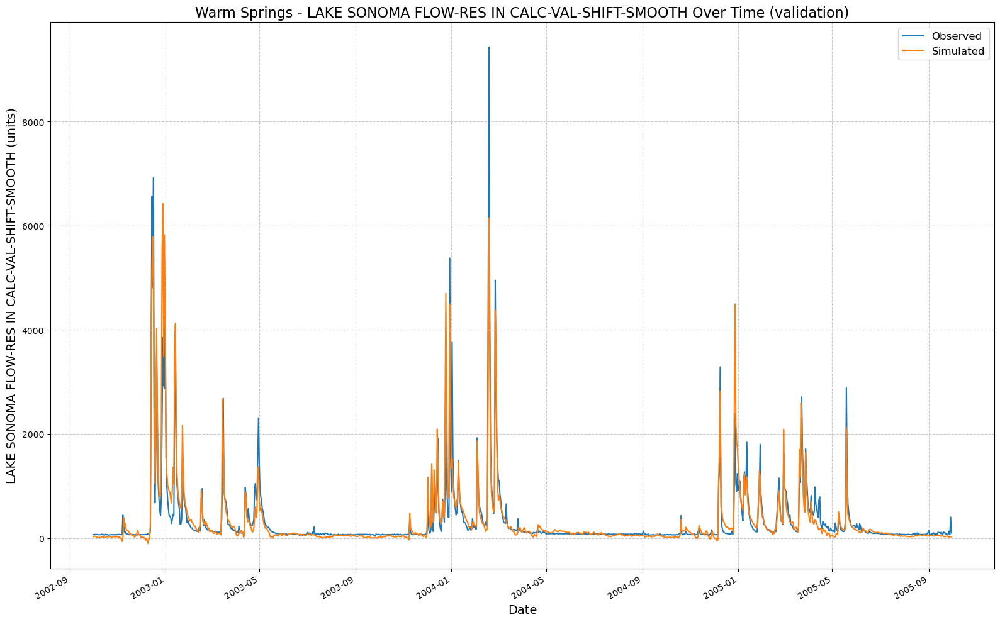

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010546/results_output_validation.csv
NoPhysics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:06:31,610: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010631/output.log initialized.
2025-02-13 01:06:31,610: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010631
2025-02-13 01:06:31,610: ### Run configurations for testing_run
2025-02-13 01:06:31,611: experiment_name: testing_run
2025-02-13 01:06:31,611: train_basin_file: warm springs
2025-02-13 01:06:31,611: validation_basin_file: warm springs
2025-02-13 01:06:31,612: test_basin_file: warm springs
2025-02-13 01:06:31,612: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:06:31,612: t

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  9.64it/s]
2025-02-13 01:06:31,734: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1407.01it/s]
2025-02-13 01:06:31,740: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.18it/s, Loss: 0.0000]
2025-02-13 01:06:34,538: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.37it/s, Loss: 0.0000]
2025-02-13 01:06:37,061: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.21it/s, Loss: 0.0000]
2025-02-13 01:06:39,675: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.43it/s, Loss: 0.0000]
2025-02-13 01:06:42,161: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.45it/s, Loss: 0.0000]
2025-02-13 01:06:44,639: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]
2025-02-13 01:07:58,419: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010631/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:07:58,420: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010631/validation/model_epoch032/validation_results.p
got predictions


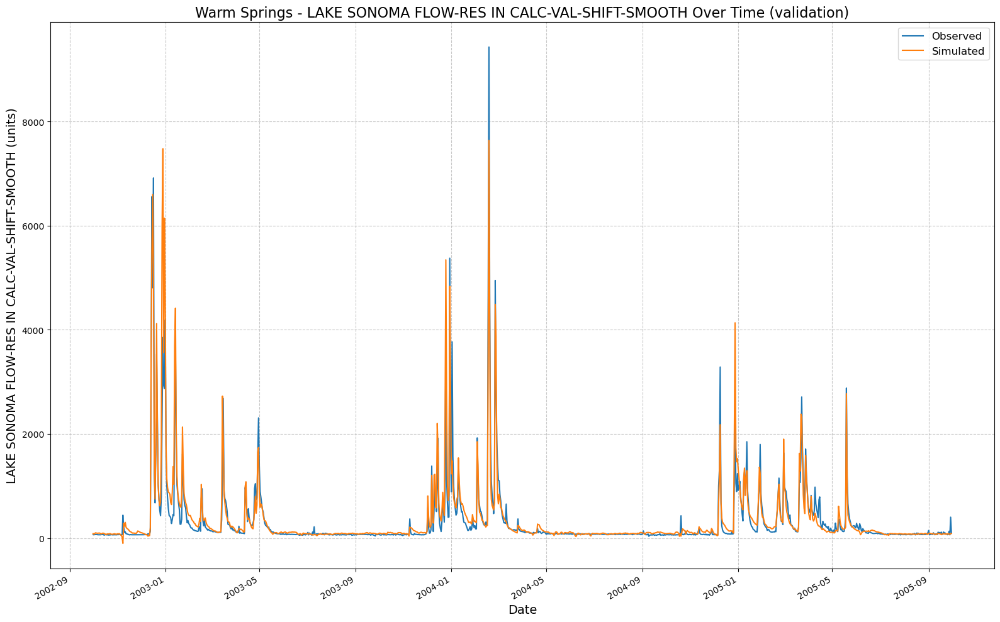

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010631/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:07:58,655: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010758/output.log initialized.
2025-02-13 01:07:58,655: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010758
2025-02-13 01:07:58,656: ### Run configurations for testing_run
2025-02-13 01:07:58,656: experiment_name: testing_run
2025-02-13 01:07:58,657: train_basin_file: warm springs
2025-02-13 01:07:58,657: validation_basin_file: warm springs
2025-02-13 01:07:58,657: test_basin_file: warm springs
2025-02-13 01:07:58,658: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:07:58,658: tr

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  9.17it/s]
2025-02-13 01:07:58,792: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1233.26it/s]
2025-02-13 01:07:58,798: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:03<00:00,  3.96it/s, Loss: 0.0000]
2025-02-13 01:08:02,011: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:02<00:00,  4.56it/s, Loss: 0.0000]
2025-02-13 01:08:04,644: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:02<00:00,  4.48it/s, Loss: 0.0000]
2025-02-13 01:08:07,324: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:02<00:00,  4.54it/s, Loss: 0.0000]
2025-02-13 01:08:09,971: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:02<00:00,  4.51it/s, Loss: 0.0000]
2025-02-13 01:08:12,634: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.82it/s]
2025-02-13 01:08:44,477: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010758/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:08:44,478: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010758/validation/model_epoch016/validation_results.p
got predictions


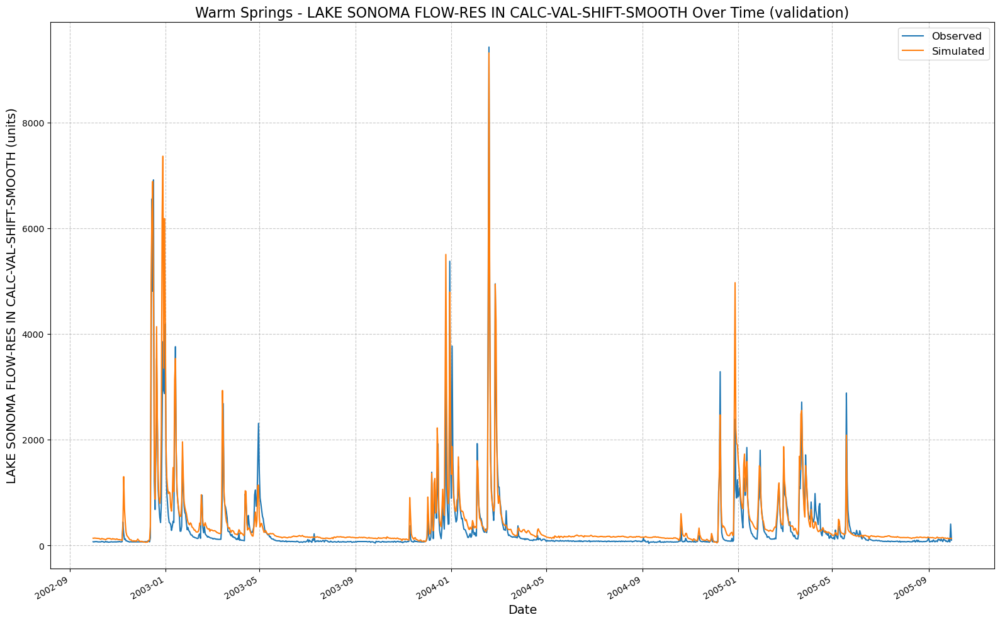

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010758/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:08:44,711: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010844/output.log initialized.
2025-02-13 01:08:44,711: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010844
2025-02-13 01:08:44,712: ### Run configurations for testing_run
2025-02-13 01:08:44,712: experiment_name: testing_run
2025-02-13 01:08:44,713: train_basin_file: warm springs
2025-02-13 01:08:44,713: validation_basin_file: warm springs
2025-02-13 01:08:44,713: test_basin_file: warm springs
2025-02-13 01:08:44,714: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:08:44,714: tr

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  9.86it/s]
2025-02-13 01:08:44,839: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1054.91it/s]
2025-02-13 01:08:44,845: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:02<00:00,  4.46it/s, Loss: 0.0000]
2025-02-13 01:08:47,702: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:02<00:00,  4.62it/s, Loss: 0.0000]
2025-02-13 01:08:50,301: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:02<00:00,  4.59it/s, Loss: 0.0000]
2025-02-13 01:08:52,920: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:02<00:00,  4.61it/s, Loss: 0.0000]
2025-02-13 01:08:55,525: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:02<00:00,  4.59it/s, Loss: 0.0000]
2025-02-13 01:08:58,144: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.63it/s]
2025-02-13 01:10:14,420: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010844/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:10:14,421: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010844/validation/model_epoch032/validation_results.p
got predictions


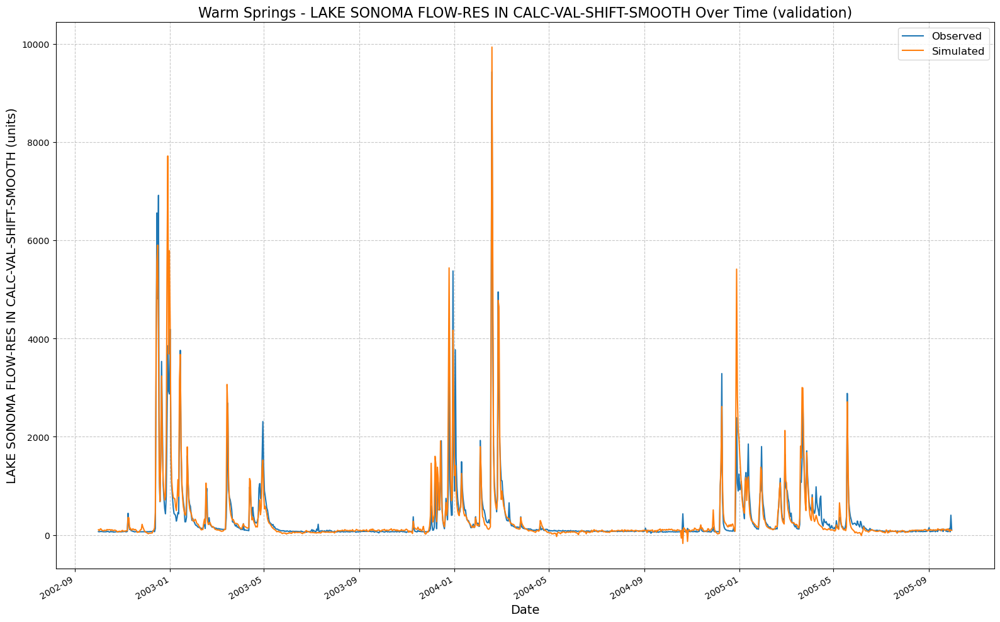

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_010844/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:10:14,661: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011014/output.log initialized.
2025-02-13 01:10:14,662: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011014
2025-02-13 01:10:14,662: ### Run configurations for testing_run
2025-02-13 01:10:14,662: experiment_name: testing_run
2025-02-13 01:10:14,663: train_basin_file: warm springs
2025-02-13 01:10:14,663: validation_basin_file: warm springs
2025-02-13 01:10:14,663: test_basin_file: warm springs
2025-02-13 01:10:14,663: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:10:14,664: tr

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  8.78it/s]
2025-02-13 01:10:14,801: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 851.12it/s]
2025-02-13 01:10:14,809: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:02<00:00,  4.25it/s, Loss: 0.0000]
2025-02-13 01:10:17,801: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:02<00:00,  4.58it/s, Loss: 0.0000]
2025-02-13 01:10:20,425: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:02<00:00,  4.61it/s, Loss: 0.0000]
2025-02-13 01:10:23,028: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:02<00:00,  4.69it/s, Loss: 0.0000]
2025-02-13 01:10:25,590: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:02<00:00,  4.46it/s, Loss: 0.0000]
2025-02-13 01:10:28,284: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.45it/s]
2025-02-13 01:11:00,144: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011014/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:11:00,145: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011014/validation/model_epoch016/validation_results.p
got predictions


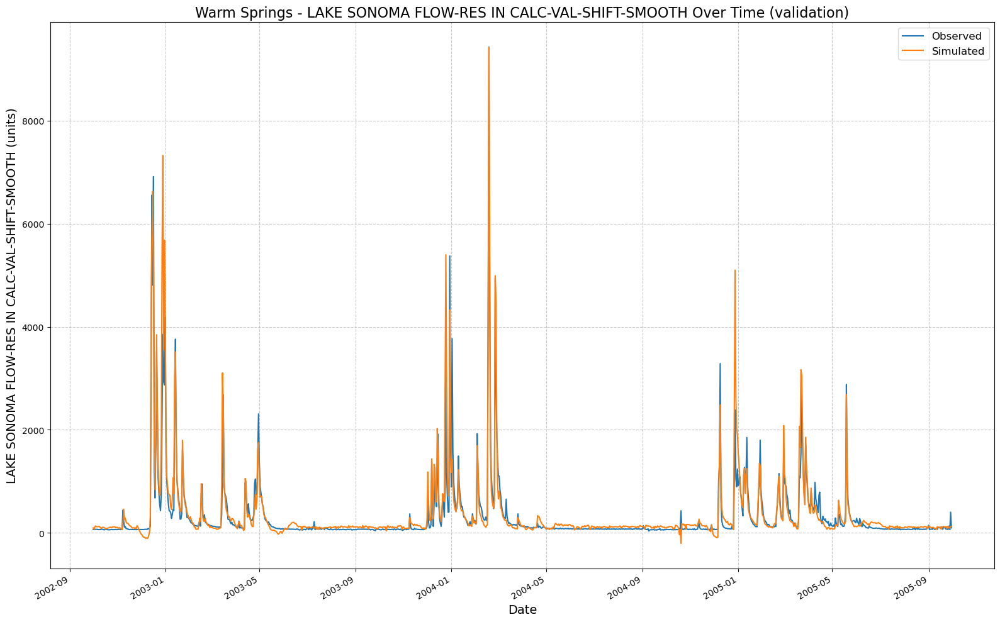

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011014/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:11:00,373: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011100/output.log initialized.
2025-02-13 01:11:00,374: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011100
2025-02-13 01:11:00,374: ### Run configurations for testing_run
2025-02-13 01:11:00,375: experiment_name: testing_run
2025-02-13 01:11:00,375: train_basin_file: warm springs
2025-02-13 01:11:00,376: validation_basin_file: warm springs
2025-02-13 01:11:00,376: test_basin_file: warm springs
2025-02-13 01:11:00,376: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:11:00,377: tr

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  7.92it/s]
2025-02-13 01:11:00,524: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1111.37it/s]
2025-02-13 01:11:00,532: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:02<00:00,  4.17it/s, Loss: 0.0000]
2025-02-13 01:11:03,579: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:02<00:00,  4.38it/s, Loss: 0.0000]
2025-02-13 01:11:06,322: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:02<00:00,  4.50it/s, Loss: 0.0000]
2025-02-13 01:11:08,989: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:02<00:00,  4.54it/s, Loss: 0.0000]
2025-02-13 01:11:11,635: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:02<00:00,  4.50it/s, Loss: 0.0000]
2025-02-13 01:11:14,304: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.43it/s]
2025-02-13 01:12:31,357: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011100/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:12:31,358: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011100/validation/model_epoch032/validation_results.p
got predictions


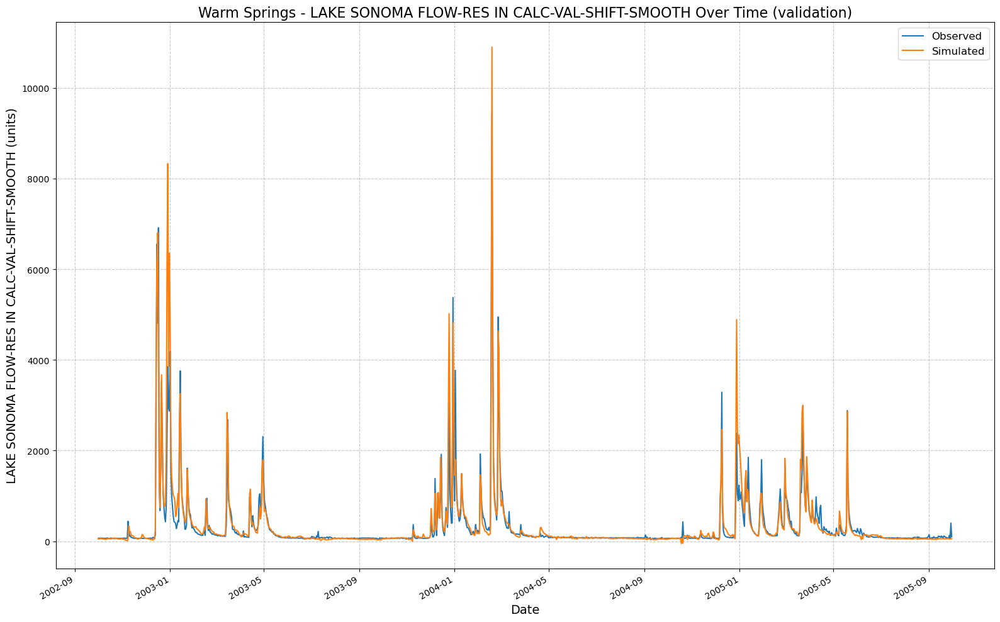

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011100/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:12:31,607: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011231/output.log initialized.
2025-02-13 01:12:31,607: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011231
2025-02-13 01:12:31,608: ### Run configurations for testing_run
2025-02-13 01:12:31,608: experiment_name: testing_run
2025-02-13 01:12:31,608: train_basin_file: warm springs
2025-02-13 01:12:31,609: validation_basin_file: warm springs
2025-02-13 01:12:31,609: test_basin_file: warm springs
2025-02-13 01:12:31,609: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:12:31,610: t

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.31it/s]
2025-02-13 01:12:31,725: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1293.34it/s]
2025-02-13 01:12:31,730: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:05<00:00,  2.05it/s, Loss: 0.0000]
2025-02-13 01:12:37,253: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:05<00:00,  2.16it/s, Loss: 0.0000]
2025-02-13 01:12:42,361: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:05<00:00,  2.07it/s, Loss: 0.0000]
2025-02-13 01:12:47,689: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:04<00:00,  2.20it/s, Loss: 0.0000]
2025-02-13 01:12:52,688: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:04<00:00,  2.20it/s, Loss: 0.0000]
2025-02-13 01:12:57,690: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]
2025-02-13 01:13:58,176: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011231/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:13:58,176: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011231/validation/model_epoch016/validation_results.p
got predictions


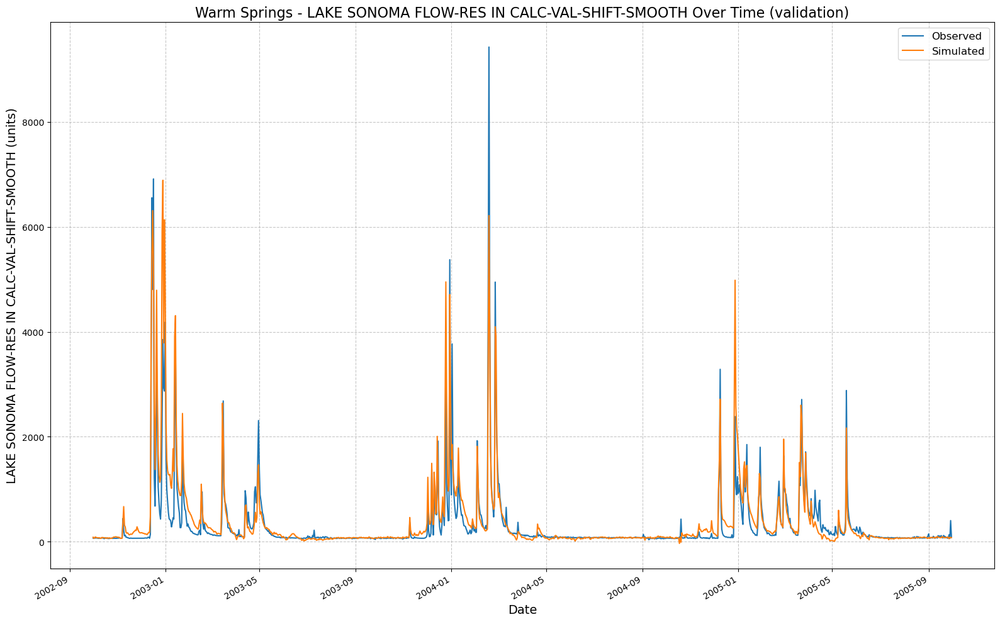

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011231/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:13:58,411: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011358/output.log initialized.
2025-02-13 01:13:58,412: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011358
2025-02-13 01:13:58,412: ### Run configurations for testing_run
2025-02-13 01:13:58,412: experiment_name: testing_run
2025-02-13 01:13:58,413: train_basin_file: warm springs
2025-02-13 01:13:58,413: validation_basin_file: warm springs
2025-02-13 01:13:58,413: test_basin_file: warm springs
2025-02-13 01:13:58,414: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:13:58,414: t

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.32it/s]
2025-02-13 01:13:58,530: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1386.55it/s]
2025-02-13 01:13:58,534: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:05<00:00,  1.99it/s, Loss: 0.0000]
2025-02-13 01:14:04,223: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:05<00:00,  2.19it/s, Loss: 0.0000]
2025-02-13 01:14:09,253: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:05<00:00,  2.19it/s, Loss: 0.0000]
2025-02-13 01:14:14,270: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:05<00:00,  2.18it/s, Loss: 0.0000]
2025-02-13 01:14:19,313: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:05<00:00,  2.14it/s, Loss: 0.0000]
2025-02-13 01:14:24,451: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]
2025-02-13 01:16:52,047: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011358/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:16:52,048: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011358/validation/model_epoch032/validation_results.p
got predictions


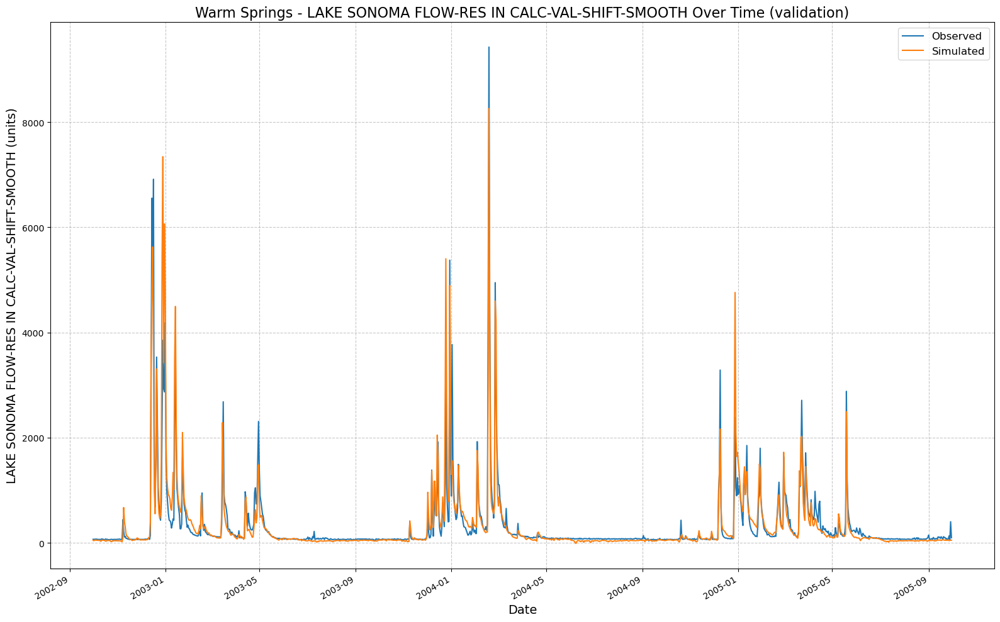

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011358/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:16:52,288: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011652/output.log initialized.
2025-02-13 01:16:52,288: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011652
2025-02-13 01:16:52,289: ### Run configurations for testing_run
2025-02-13 01:16:52,289: experiment_name: testing_run
2025-02-13 01:16:52,289: train_basin_file: warm springs
2025-02-13 01:16:52,289: validation_basin_file: warm springs
2025-02-13 01:16:52,290: test_basin_file: warm springs
2025-02-13 01:16:52,290: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:16:52,290: t

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00, 10.22it/s]
2025-02-13 01:16:52,406: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1259.55it/s]
2025-02-13 01:16:52,410: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:05<00:00,  2.14it/s, Loss: 0.0000]
2025-02-13 01:16:57,698: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:05<00:00,  2.18it/s, Loss: 0.0000]
2025-02-13 01:17:02,746: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:04<00:00,  2.23it/s, Loss: 0.0000]
2025-02-13 01:17:07,685: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:05<00:00,  2.17it/s, Loss: 0.0000]
2025-02-13 01:17:12,748: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:04<00:00,  2.20it/s, Loss: 0.0000]
2025-02-13 01:17:17,746: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]
2025-02-13 01:18:18,735: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011652/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:18:18,736: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011652/validation/model_epoch016/validation_results.p
got predictions


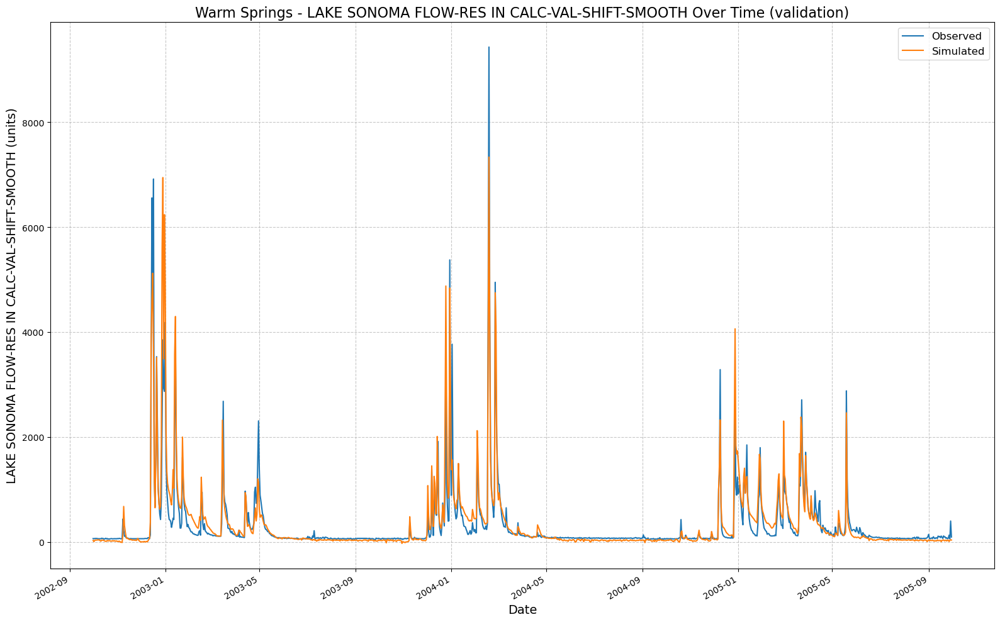

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011652/results_output_validation.csv
NoPhysics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:18:18,970: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011818/output.log initialized.
2025-02-13 01:18:18,971: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011818
2025-02-13 01:18:18,971: ### Run configurations for testing_run
2025-02-13 01:18:18,972: experiment_name: testing_run
2025-02-13 01:18:18,972: train_basin_file: warm springs
2025-02-13 01:18:18,973: validation_basin_file: warm springs
2025-02-13 01:18:18,973: test_basin_file: warm springs
2025-02-13 01:18:18,974: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:18:18,974: t

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  9.95it/s]
2025-02-13 01:18:19,095: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1295.74it/s]
2025-02-13 01:18:19,101: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:05<00:00,  2.06it/s, Loss: 0.0000]
2025-02-13 01:18:24,622: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:05<00:00,  2.12it/s, Loss: 0.0000]
2025-02-13 01:18:29,818: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:05<00:00,  2.12it/s, Loss: 0.0000]
2025-02-13 01:18:35,025: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:05<00:00,  2.20it/s, Loss: 0.0000]
2025-02-13 01:18:40,038: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:04<00:00,  2.24it/s, Loss: 0.0000]
2025-02-13 01:18:44,953: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.11s/it]
2025-02-13 01:21:11,952: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011818/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:21:11,953: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011818/validation/model_epoch032/validation_results.p
got predictions


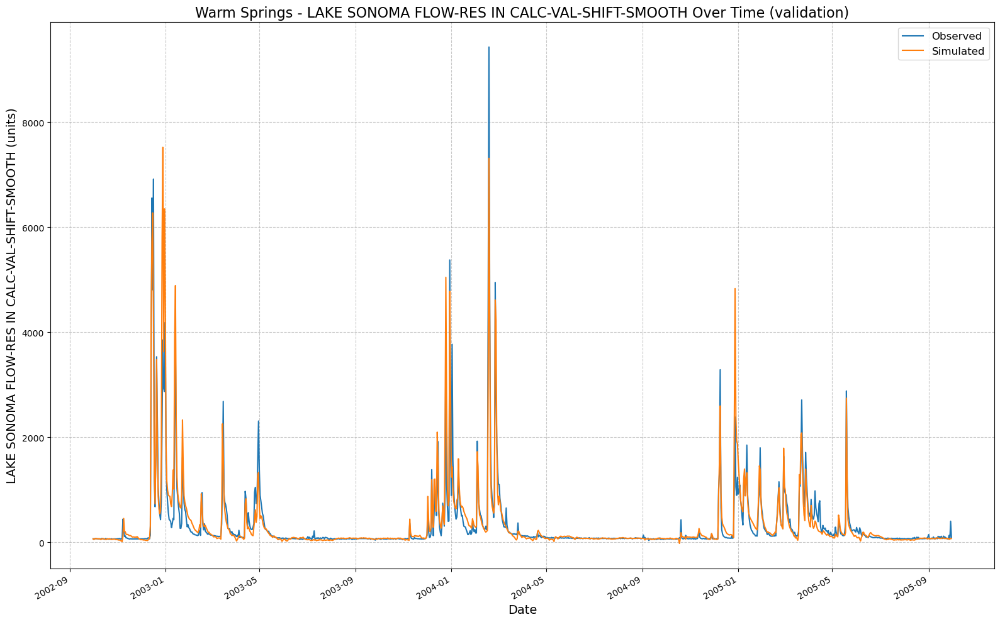

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_011818/results_output_validation.csv


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [8]:
for (hs, seq, nl, ep) in itertools.product(
        hyperparam_space["hidden_size"],
        hyperparam_space["seq_length"],
        hyperparam_space["num_layers"],
        hyperparam_space["epochs"]
):
    hp = {
        "hidden_size": hs,
        "seq_length": seq,
        "num_layers": nl,
        "epochs": ep,
        "output_dropout": fixed_dropout,
    }
    print(f"NoPhysics: {hp}")
    trainer = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=hp,
        input_features=None,
        physics_informed=False,
        physics_data_file=None,
        hourly=False,
        extend_train_period=False,
        gpu=-1
    )
    trainer.train()
    csv_path, metrics_dict = trainer.results()
    row_data = {"hidden_size": hs, "seq_length": seq, "num_layers": nl, "epochs": ep, "output_dropout": fixed_dropout}
    for k, v in metrics_dict.items():
        row_data[k] = v
    no_physics_results.append(row_data)

Physics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:21:12,202: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012112/output.log initialized.
2025-02-13 01:21:12,202: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012112
2025-02-13 01:21:12,202: ### Run configurations for testing_run
2025-02-13 01:21:12,203: experiment_name: testing_run
2025-02-13 01:21:12,203: train_basin_file: warm springs
2025-02-13 01:21:12,203: validation_basin_file: warm springs
2025-02-13 01:21:12,204: test_basin_file: warm springs
2025-02-13 01:21:12,204: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:21:12,204: train_end_date: 2002-09-30 00:00:00
2025-02-13 01:21:12,205: validation_start_date: 2002-10-01 00:00:00
2025-02-13 01:21:12,205: validation_end_date: 2005-09-30 00:00:0

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.83it/s]
2025-02-13 01:21:27,601: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012112/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:21:27,603: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012112/validation/model_epoch016/validation_results.p
got predictions


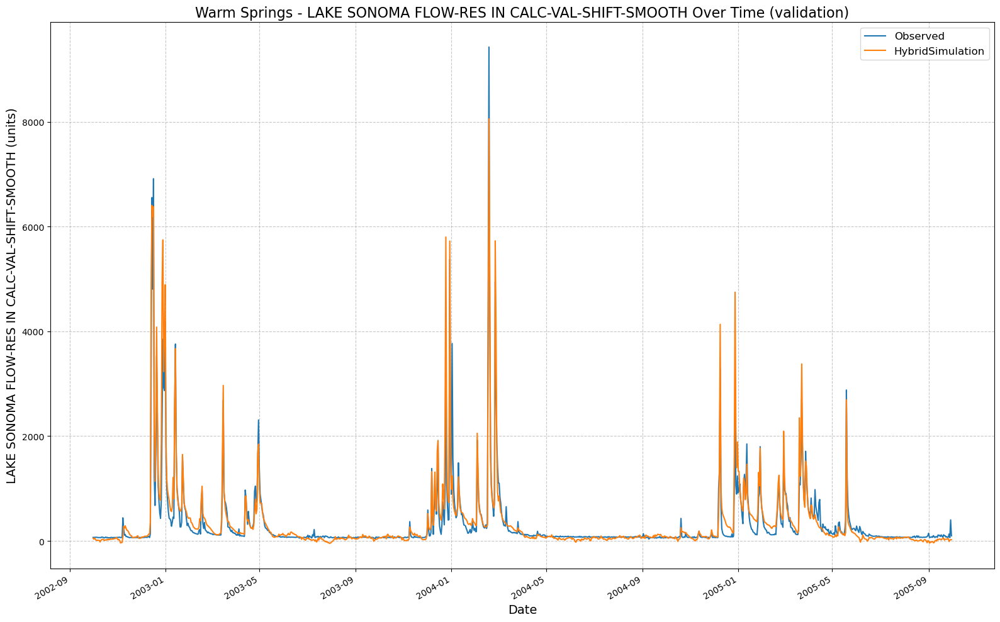

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012112/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:21:27,836: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012127/output.log initialized.
2025-02-13 01:21:27,836: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012127
2025-02-13 01:21:27,837: ### Run configurations for testing_run
2025-02-13 01:21:27,837: experiment_name: testing_run
2025-02-13 01:21:27,837: train_basin_file: warm springs
2025-02-13 01:21:27,838: validation_basin_file: warm springs
2025-02-13 01:21:27,838: test_basin_file: warm springs
2025-02-13 01:21:27,839: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:21:27,839: train

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.00it/s]
2025-02-13 01:21:28,026: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 833.36it/s]
2025-02-13 01:21:28,034: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:00<00:00, 14.63it/s, Loss: 0.0000]
2025-02-13 01:21:29,013: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:00<00:00, 13.88it/s, Loss: 0.0000]
2025-02-13 01:21:29,880: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:00<00:00, 13.93it/s, Loss: 0.0000]
2025-02-13 01:21:30,743: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:00<00:00, 13.82it/s, Loss: 0.0000]
2025-02-13 01:21:31,614: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:00<00:00, 14.04it/s, Loss: 0.0000]
2025-02-13 01:21:32,470: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]
2025-02-13 01:21:57,598: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012127/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:21:57,600: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012127/validation/model_epoch032/validation_results.p
got predictions


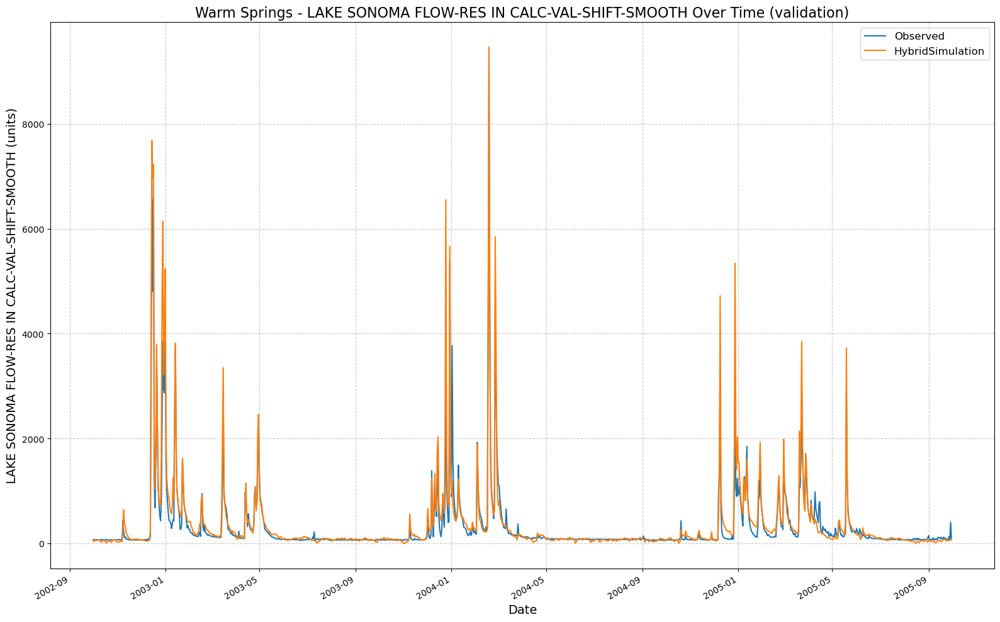

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012127/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:21:57,828: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012157/output.log initialized.
2025-02-13 01:21:57,829: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012157
2025-02-13 01:21:57,830: ### Run configurations for testing_run
2025-02-13 01:21:57,830: experiment_name: testing_run
2025-02-13 01:21:57,831: train_basin_file: warm springs
2025-02-13 01:21:57,832: validation_basin_file: warm springs
2025-02-13 01:21:57,832: test_basin_file: warm springs
2025-02-13 01:21:57,833: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:21:57,833: train

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  5.51it/s]
2025-02-13 01:21:58,039: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 892.79it/s]
2025-02-13 01:21:58,048: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:00<00:00, 13.25it/s, Loss: 0.0000]
2025-02-13 01:21:59,126: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:00<00:00, 14.83it/s, Loss: 0.0000]
2025-02-13 01:21:59,938: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:00<00:00, 14.04it/s, Loss: 0.0000]
2025-02-13 01:22:00,794: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:00<00:00, 13.63it/s, Loss: 0.0000]
2025-02-13 01:22:01,677: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:00<00:00, 14.35it/s, Loss: 0.0000]
2025-02-13 01:22:02,515: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.16it/s]
2025-02-13 01:22:12,862: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012157/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:22:12,863: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012157/validation/model_epoch016/validation_results.p
got predictions


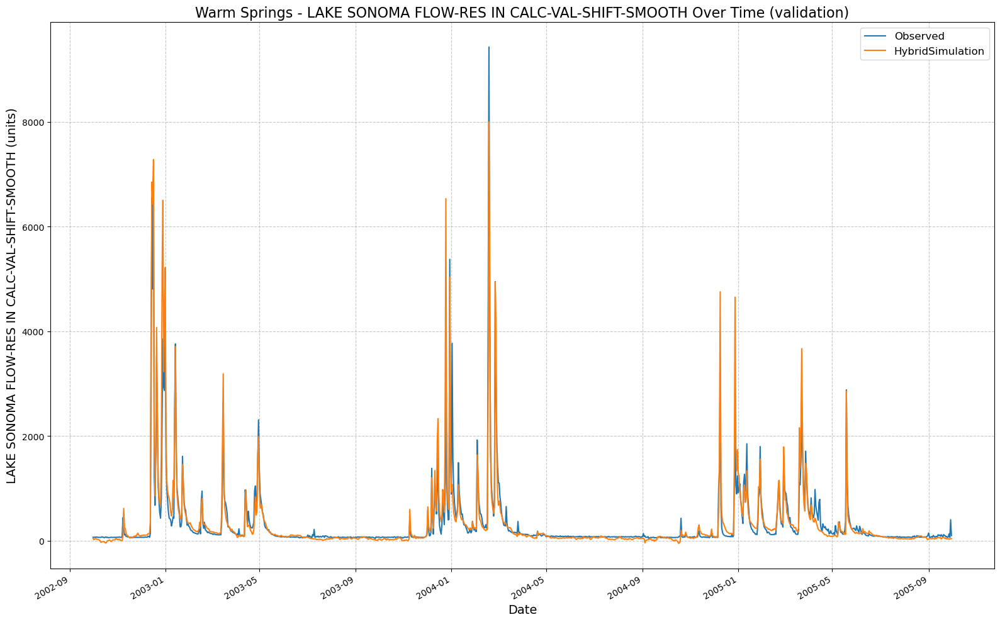

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012157/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:22:13,102: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012213/output.log initialized.
2025-02-13 01:22:13,103: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012213
2025-02-13 01:22:13,103: ### Run configurations for testing_run
2025-02-13 01:22:13,103: experiment_name: testing_run
2025-02-13 01:22:13,104: train_basin_file: warm springs
2025-02-13 01:22:13,104: validation_basin_file: warm springs
2025-02-13 01:22:13,105: test_basin_file: warm springs
2025-02-13 01:22:13,105: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:22:13,105: train

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.00it/s]
2025-02-13 01:22:13,291: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1048.05it/s]
2025-02-13 01:22:13,297: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:00<00:00, 14.60it/s, Loss: 0.0000]
2025-02-13 01:22:14,269: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:00<00:00, 14.83it/s, Loss: 0.0000]
2025-02-13 01:22:15,081: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:00<00:00, 13.81it/s, Loss: 0.0000]
2025-02-13 01:22:15,953: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:00<00:00, 14.57it/s, Loss: 0.0000]
2025-02-13 01:22:16,778: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:00<00:00, 14.32it/s, Loss: 0.0000]
2025-02-13 01:22:17,618: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]
2025-02-13 01:22:42,181: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012213/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:22:42,181: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012213/validation/model_epoch032/validation_results.p
got predictions


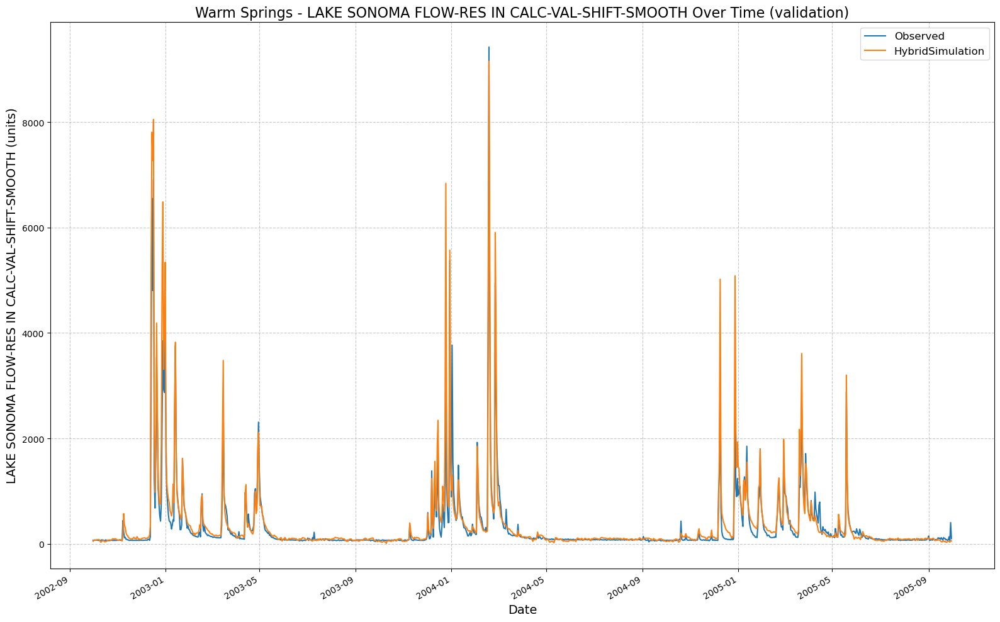

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012213/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:22:42,413: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012242/output.log initialized.
2025-02-13 01:22:42,413: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012242
2025-02-13 01:22:42,414: ### Run configurations for testing_run
2025-02-13 01:22:42,414: experiment_name: testing_run
2025-02-13 01:22:42,415: train_basin_file: warm springs
2025-02-13 01:22:42,415: validation_basin_file: warm springs
2025-02-13 01:22:42,415: test_basin_file: warm springs
2025-02-13 01:22:42,416: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:22:42,416: trai

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.43it/s]
2025-02-13 01:22:42,590: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 705.16it/s]
2025-02-13 01:22:42,597: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.19it/s, Loss: 0.0000]
2025-02-13 01:22:44,303: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  7.30it/s, Loss: 0.0000]
2025-02-13 01:22:45,817: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.40it/s, Loss: 0.0000]
2025-02-13 01:22:47,307: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.45it/s, Loss: 0.0000]
2025-02-13 01:22:48,788: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  7.41it/s, Loss: 0.0000]
2025-02-13 01:22:50,278: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.11it/s]
2025-02-13 01:23:08,700: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012242/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:23:08,701: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012242/validation/model_epoch016/validation_results.p
got predictions


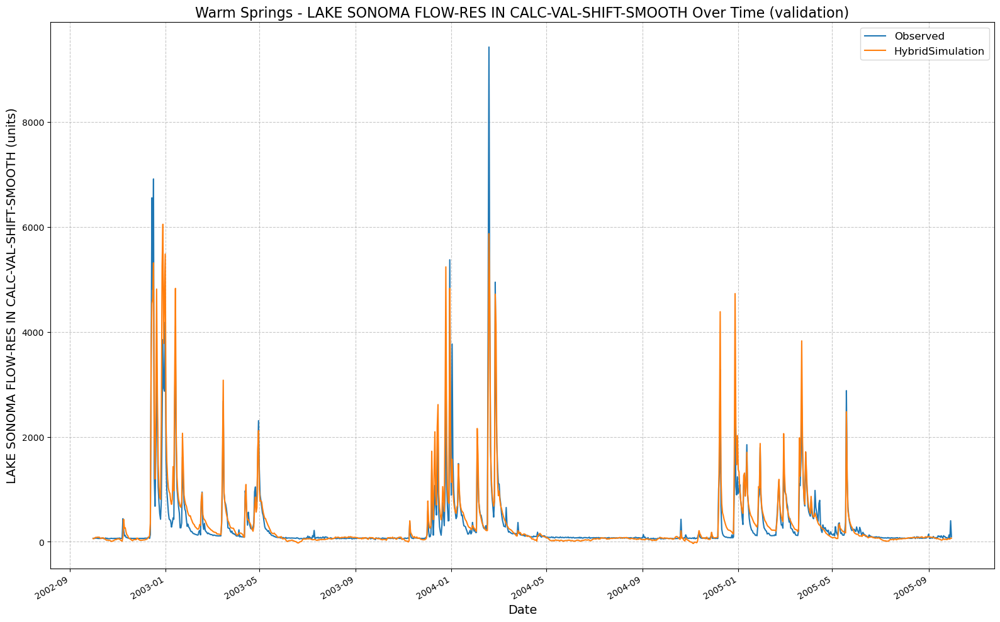

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012242/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:23:08,932: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012308/output.log initialized.
2025-02-13 01:23:08,932: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012308
2025-02-13 01:23:08,933: ### Run configurations for testing_run
2025-02-13 01:23:08,933: experiment_name: testing_run
2025-02-13 01:23:08,934: train_basin_file: warm springs
2025-02-13 01:23:08,934: validation_basin_file: warm springs
2025-02-13 01:23:08,935: test_basin_file: warm springs
2025-02-13 01:23:08,935: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:23:08,935: trai

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  5.89it/s]
2025-02-13 01:23:09,126: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 941.48it/s]
2025-02-13 01:23:09,134: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.62it/s, Loss: 0.0000]
2025-02-13 01:23:10,737: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  7.34it/s, Loss: 0.0000]
2025-02-13 01:23:12,240: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.46it/s, Loss: 0.0000]
2025-02-13 01:23:13,719: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.47it/s, Loss: 0.0000]
2025-02-13 01:23:15,194: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  7.26it/s, Loss: 0.0000]
2025-02-13 01:23:16,714: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.71it/s]
2025-02-13 01:23:59,026: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012308/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:23:59,028: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012308/validation/model_epoch032/validation_results.p
got predictions


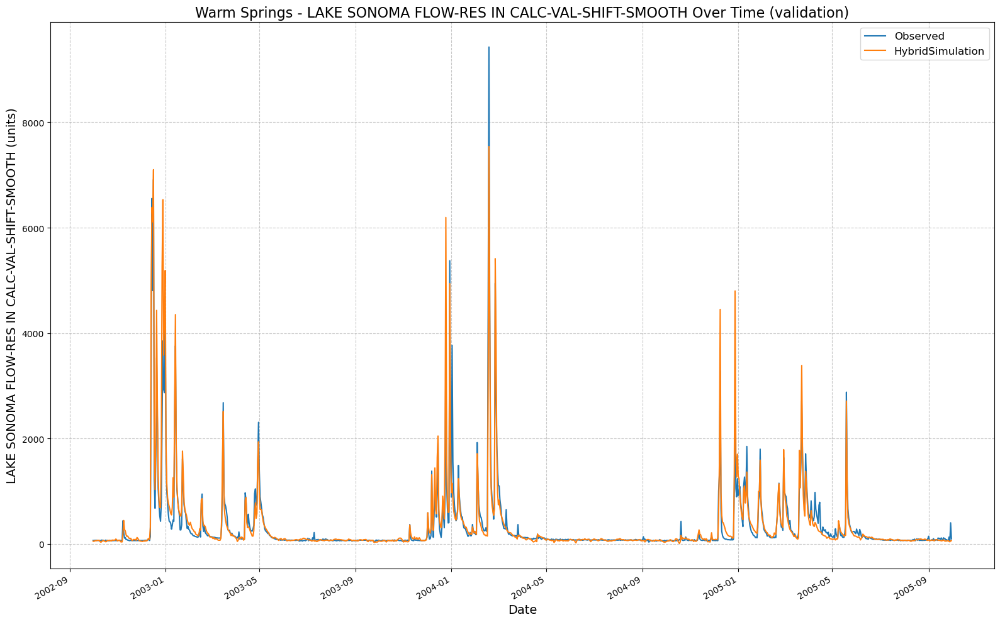

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012308/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:23:59,264: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012359/output.log initialized.
2025-02-13 01:23:59,265: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012359
2025-02-13 01:23:59,265: ### Run configurations for testing_run
2025-02-13 01:23:59,265: experiment_name: testing_run
2025-02-13 01:23:59,266: train_basin_file: warm springs
2025-02-13 01:23:59,266: validation_basin_file: warm springs
2025-02-13 01:23:59,266: test_basin_file: warm springs
2025-02-13 01:23:59,267: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:23:59,267: trai

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.15it/s]
2025-02-13 01:23:59,453: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 969.11it/s]
2025-02-13 01:23:59,462: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.62it/s, Loss: 0.0000]
2025-02-13 01:24:01,074: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  7.33it/s, Loss: 0.0000]
2025-02-13 01:24:02,580: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.41it/s, Loss: 0.0000]
2025-02-13 01:24:04,069: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.41it/s, Loss: 0.0000]
2025-02-13 01:24:05,557: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  7.34it/s, Loss: 0.0000]
2025-02-13 01:24:07,060: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]
2025-02-13 01:24:25,256: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012359/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:24:25,257: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012359/validation/model_epoch016/validation_results.p
got predictions


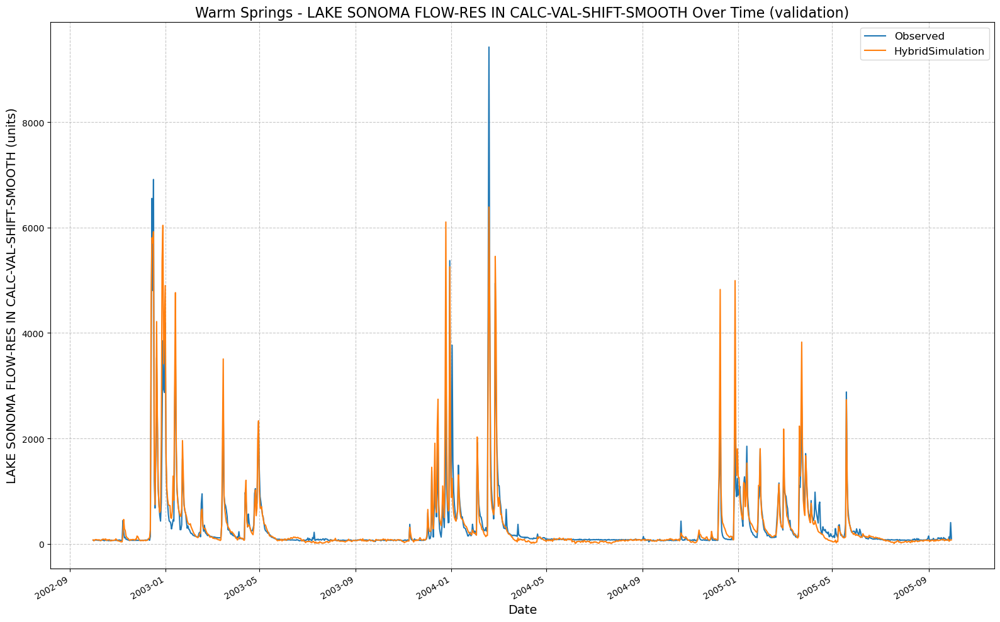

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012359/results_output_validation.csv
Physics: {'hidden_size': 64, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:24:25,488: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012425/output.log initialized.
2025-02-13 01:24:25,488: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012425
2025-02-13 01:24:25,488: ### Run configurations for testing_run
2025-02-13 01:24:25,489: experiment_name: testing_run
2025-02-13 01:24:25,489: train_basin_file: warm springs
2025-02-13 01:24:25,490: validation_basin_file: warm springs
2025-02-13 01:24:25,490: test_basin_file: warm springs
2025-02-13 01:24:25,491: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:24:25,491: trai

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.08it/s]
2025-02-13 01:24:25,682: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1214.68it/s]
2025-02-13 01:24:25,690: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:01<00:00,  7.61it/s, Loss: 0.0000]
2025-02-13 01:24:27,300: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:01<00:00,  7.41it/s, Loss: 0.0000]
2025-02-13 01:24:28,789: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:01<00:00,  7.36it/s, Loss: 0.0000]
2025-02-13 01:24:30,286: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:01<00:00,  7.14it/s, Loss: 0.0000]
2025-02-13 01:24:31,834: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:01<00:00,  7.64it/s, Loss: 0.0000]
2025-02-13 01:24:33,277: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.07it/s]
2025-02-13 01:25:15,547: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012425/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:25:15,548: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012425/validation/model_epoch032/validation_results.p
got predictions


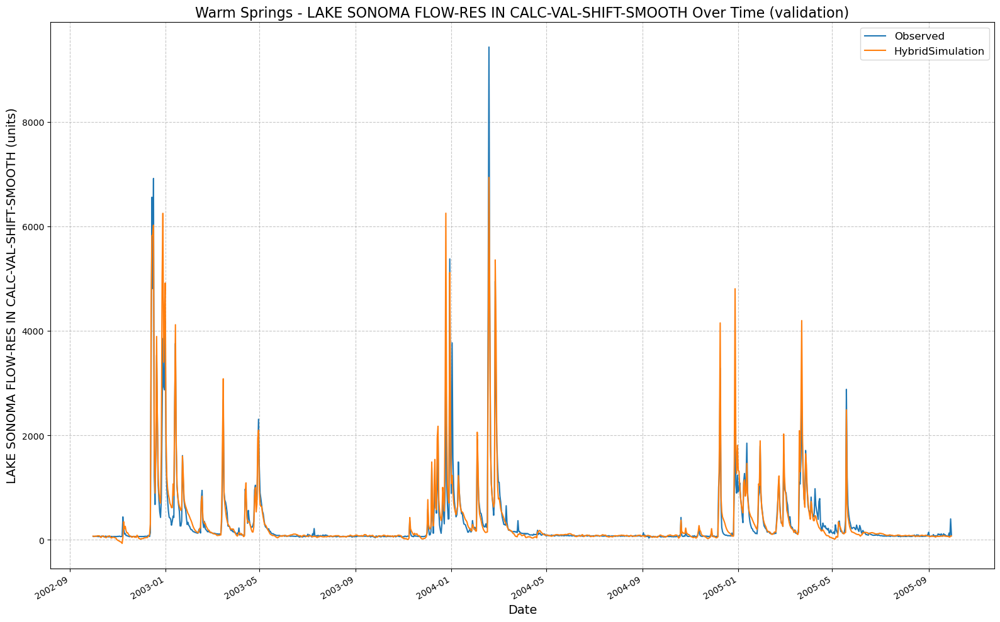

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012425/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:25:15,785: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012515/output.log initialized.
2025-02-13 01:25:15,786: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012515
2025-02-13 01:25:15,786: ### Run configurations for testing_run
2025-02-13 01:25:15,786: experiment_name: testing_run
2025-02-13 01:25:15,787: train_basin_file: warm springs
2025-02-13 01:25:15,787: validation_basin_file: warm springs
2025-02-13 01:25:15,787: test_basin_file: warm springs
2025-02-13 01:25:15,788: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:25:15,788: trai

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  5.80it/s]
2025-02-13 01:25:15,984: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1064.81it/s]
2025-02-13 01:25:15,991: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:01<00:00,  8.48it/s, Loss: 0.0000]
2025-02-13 01:25:17,561: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:01<00:00,  8.34it/s, Loss: 0.0000]
2025-02-13 01:25:19,003: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:01<00:00,  8.35it/s, Loss: 0.0000]
2025-02-13 01:25:20,443: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:01<00:00,  8.24it/s, Loss: 0.0000]
2025-02-13 01:25:21,902: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:01<00:00,  9.29it/s, Loss: 0.0000]
2025-02-13 01:25:23,196: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  2.23it/s]
2025-02-13 01:25:40,364: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012515/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:25:40,365: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012515/validation/model_epoch016/validation_results.p
got predictions


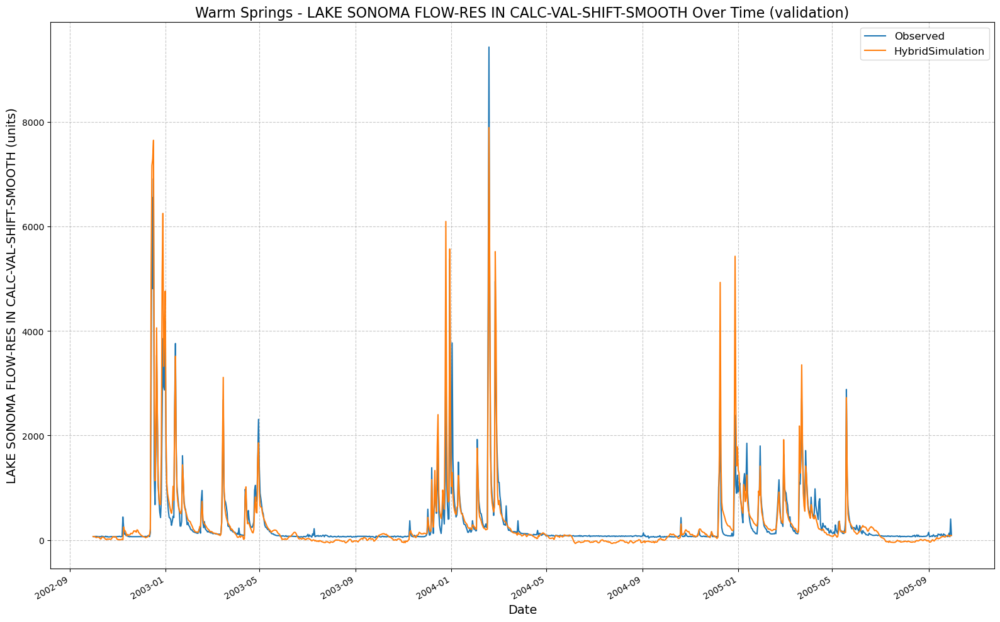

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012515/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:25:40,598: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012540/output.log initialized.
2025-02-13 01:25:40,598: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012540
2025-02-13 01:25:40,599: ### Run configurations for testing_run
2025-02-13 01:25:40,599: experiment_name: testing_run
2025-02-13 01:25:40,600: train_basin_file: warm springs
2025-02-13 01:25:40,600: validation_basin_file: warm springs
2025-02-13 01:25:40,601: test_basin_file: warm springs
2025-02-13 01:25:40,602: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:25:40,602: trai

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  5.70it/s]
2025-02-13 01:25:40,797: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1089.15it/s]
2025-02-13 01:25:40,804: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:01<00:00,  8.77it/s, Loss: 0.0000]
2025-02-13 01:25:42,320: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:01<00:00,  8.45it/s, Loss: 0.0000]
2025-02-13 01:25:43,745: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:01<00:00,  8.52it/s, Loss: 0.0000]
2025-02-13 01:25:45,155: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:01<00:00,  8.41it/s, Loss: 0.0000]
2025-02-13 01:25:46,585: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:01<00:00,  8.59it/s, Loss: 0.0000]
2025-02-13 01:25:47,984: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.93it/s]
2025-02-13 01:26:33,899: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012540/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:26:33,900: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012540/validation/model_epoch032/validation_results.p
got predictions


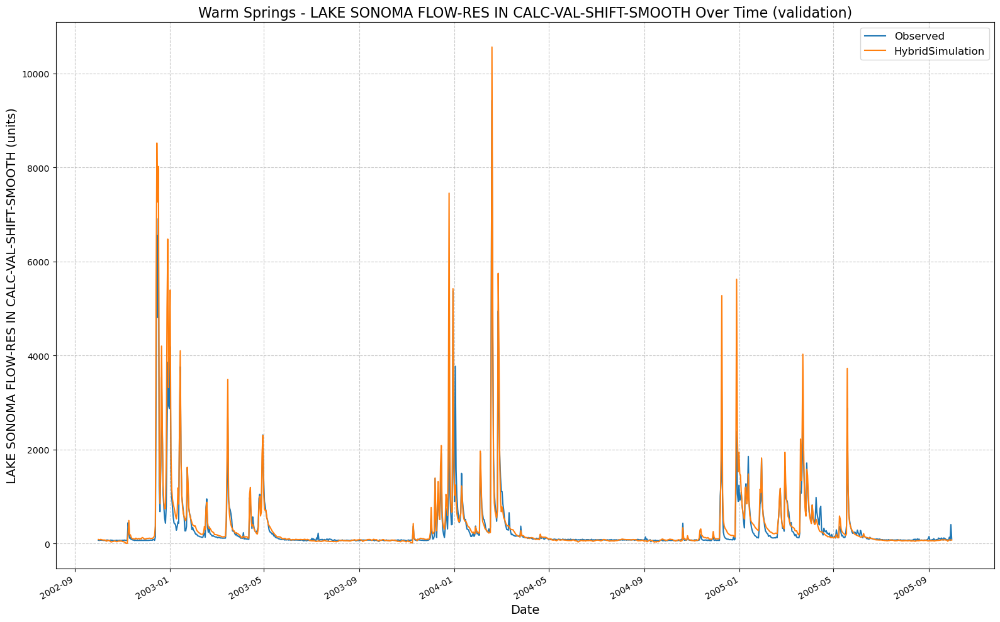

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012540/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:26:34,127: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012634/output.log initialized.
2025-02-13 01:26:34,127: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012634
2025-02-13 01:26:34,128: ### Run configurations for testing_run
2025-02-13 01:26:34,128: experiment_name: testing_run
2025-02-13 01:26:34,128: train_basin_file: warm springs
2025-02-13 01:26:34,129: validation_basin_file: warm springs
2025-02-13 01:26:34,129: test_basin_file: warm springs
2025-02-13 01:26:34,129: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:26:34,130: trai

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.60it/s]
2025-02-13 01:26:34,304: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1146.61it/s]
2025-02-13 01:26:34,310: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:01<00:00,  8.46it/s, Loss: 0.0000]
2025-02-13 01:26:35,885: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:01<00:00,  9.47it/s, Loss: 0.0000]
2025-02-13 01:26:37,153: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:01<00:00,  8.71it/s, Loss: 0.0000]
2025-02-13 01:26:38,534: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:01<00:00,  8.04it/s, Loss: 0.0000]
2025-02-13 01:26:40,030: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:01<00:00,  9.25it/s, Loss: 0.0000]
2025-02-13 01:26:41,331: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]
2025-02-13 01:27:00,283: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012634/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:27:00,284: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012634/validation/model_epoch016/validation_results.p
got predictions


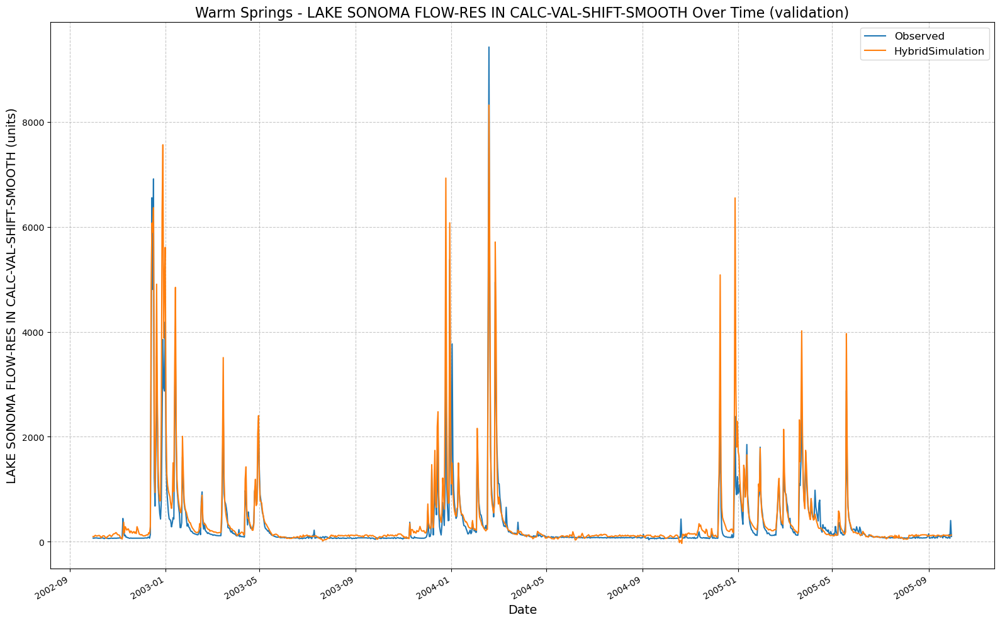

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012634/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:27:00,594: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012700/output.log initialized.
2025-02-13 01:27:00,595: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012700
2025-02-13 01:27:00,595: ### Run configurations for testing_run
2025-02-13 01:27:00,595: experiment_name: testing_run
2025-02-13 01:27:00,595: train_basin_file: warm springs
2025-02-13 01:27:00,596: validation_basin_file: warm springs
2025-02-13 01:27:00,596: test_basin_file: warm springs
2025-02-13 01:27:00,596: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:27:00,597: trai

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.23it/s]
2025-02-13 01:27:00,777: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1145.67it/s]
2025-02-13 01:27:00,784: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:01<00:00,  8.24it/s, Loss: 0.0000]
2025-02-13 01:27:02,392: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:01<00:00,  9.21it/s, Loss: 0.0000]
2025-02-13 01:27:03,698: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:01<00:00,  6.40it/s, Loss: 0.0000]
2025-02-13 01:27:05,576: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:01<00:00,  8.08it/s, Loss: 0.0000]
2025-02-13 01:27:07,065: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:01<00:00,  6.89it/s, Loss: 0.0000]
2025-02-13 01:27:08,810: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.86it/s]
2025-02-13 01:27:50,321: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012700/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:27:50,322: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012700/validation/model_epoch032/validation_results.p
got predictions


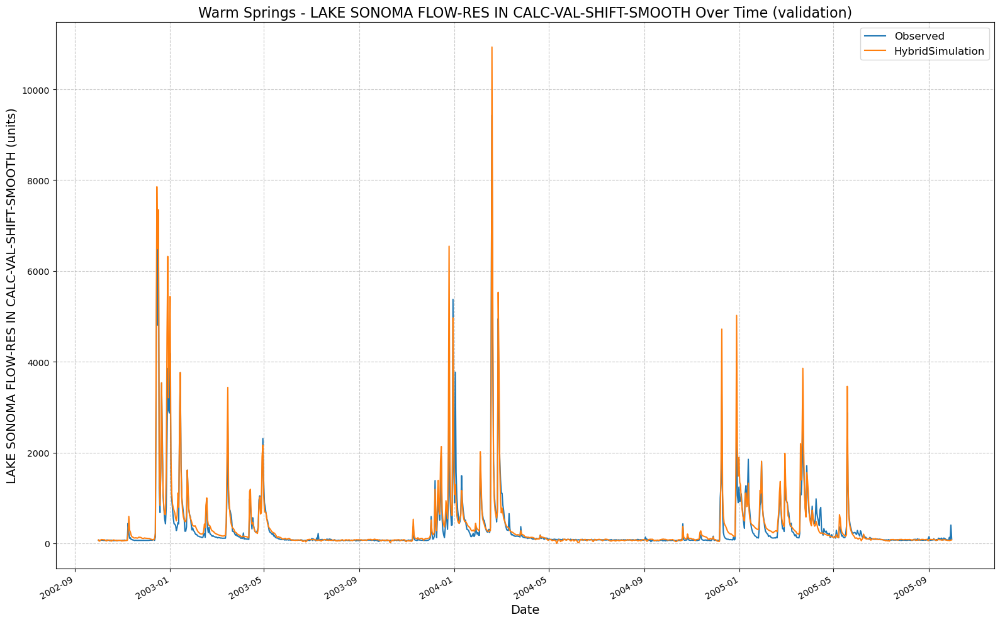

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012700/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:27:50,553: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012750/output.log initialized.
2025-02-13 01:27:50,554: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012750
2025-02-13 01:27:50,554: ### Run configurations for testing_run
2025-02-13 01:27:50,555: experiment_name: testing_run
2025-02-13 01:27:50,555: train_basin_file: warm springs
2025-02-13 01:27:50,555: validation_basin_file: warm springs
2025-02-13 01:27:50,556: test_basin_file: warm springs
2025-02-13 01:27:50,556: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:27:50,557: tra

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.66it/s]
2025-02-13 01:27:50,725: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1113.43it/s]
2025-02-13 01:27:50,731: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:03<00:00,  3.16it/s, Loss: 0.0000]
2025-02-13 01:27:54,353: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:03<00:00,  3.17it/s, Loss: 0.0000]
2025-02-13 01:27:57,836: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.01it/s, Loss: 0.0000]
2025-02-13 01:28:00,582: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  3.99it/s, Loss: 0.0000]
2025-02-13 01:28:03,343: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:03<00:00,  3.63it/s, Loss: 0.0000]
2025-02-13 01:28:06,381: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.23it/s]
2025-02-13 01:28:39,267: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012750/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:28:39,268: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012750/validation/model_epoch016/validation_results.p
got predictions


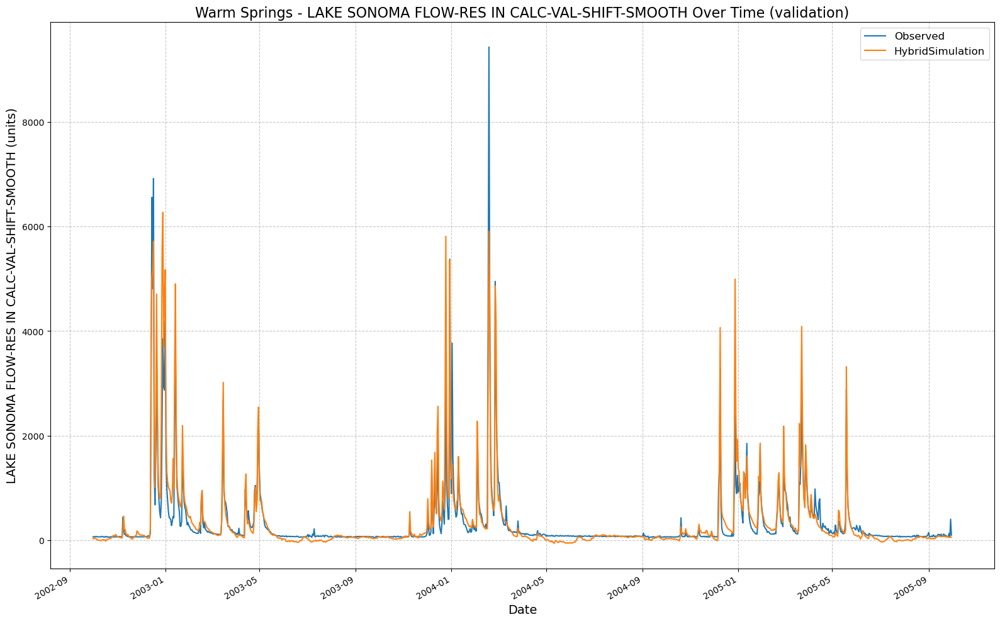

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012750/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:28:39,495: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012839/output.log initialized.
2025-02-13 01:28:39,495: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012839
2025-02-13 01:28:39,495: ### Run configurations for testing_run
2025-02-13 01:28:39,496: experiment_name: testing_run
2025-02-13 01:28:39,496: train_basin_file: warm springs
2025-02-13 01:28:39,496: validation_basin_file: warm springs
2025-02-13 01:28:39,497: test_basin_file: warm springs
2025-02-13 01:28:39,497: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:28:39,498: tra

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.44it/s]
2025-02-13 01:28:39,671: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1146.61it/s]
2025-02-13 01:28:39,678: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  3.88it/s, Loss: 0.0000]
2025-02-13 01:28:42,673: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.31it/s, Loss: 0.0000]
2025-02-13 01:28:45,228: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.08it/s, Loss: 0.0000]
2025-02-13 01:28:47,928: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.22it/s, Loss: 0.0000]
2025-02-13 01:28:50,539: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  3.69it/s, Loss: 0.0000]
2025-02-13 01:28:53,526: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]
2025-02-13 01:30:10,079: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012839/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:30:10,080: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012839/validation/model_epoch032/validation_results.p
got predictions


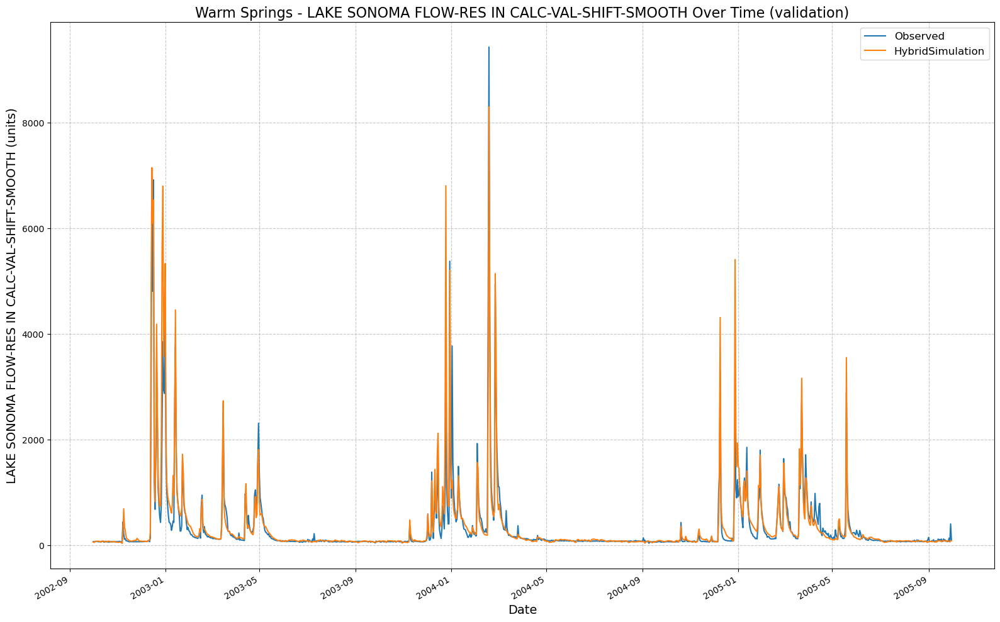

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_012839/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:30:10,303: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013010/output.log initialized.
2025-02-13 01:30:10,303: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013010
2025-02-13 01:30:10,303: ### Run configurations for testing_run
2025-02-13 01:30:10,304: experiment_name: testing_run
2025-02-13 01:30:10,304: train_basin_file: warm springs
2025-02-13 01:30:10,304: validation_basin_file: warm springs
2025-02-13 01:30:10,305: test_basin_file: warm springs
2025-02-13 01:30:10,305: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:30:10,305: tra

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.52it/s]
2025-02-13 01:30:10,479: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1141.62it/s]
2025-02-13 01:30:10,485: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.26it/s, Loss: 0.0000]
2025-02-13 01:30:13,245: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.24it/s, Loss: 0.0000]
2025-02-13 01:30:15,844: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.44it/s, Loss: 0.0000]
2025-02-13 01:30:18,325: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.32it/s, Loss: 0.0000]
2025-02-13 01:30:20,875: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  3.86it/s, Loss: 0.0000]
2025-02-13 01:30:23,725: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.21it/s]
2025-02-13 01:30:56,138: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013010/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:30:56,138: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013010/validation/model_epoch016/validation_results.p
got predictions


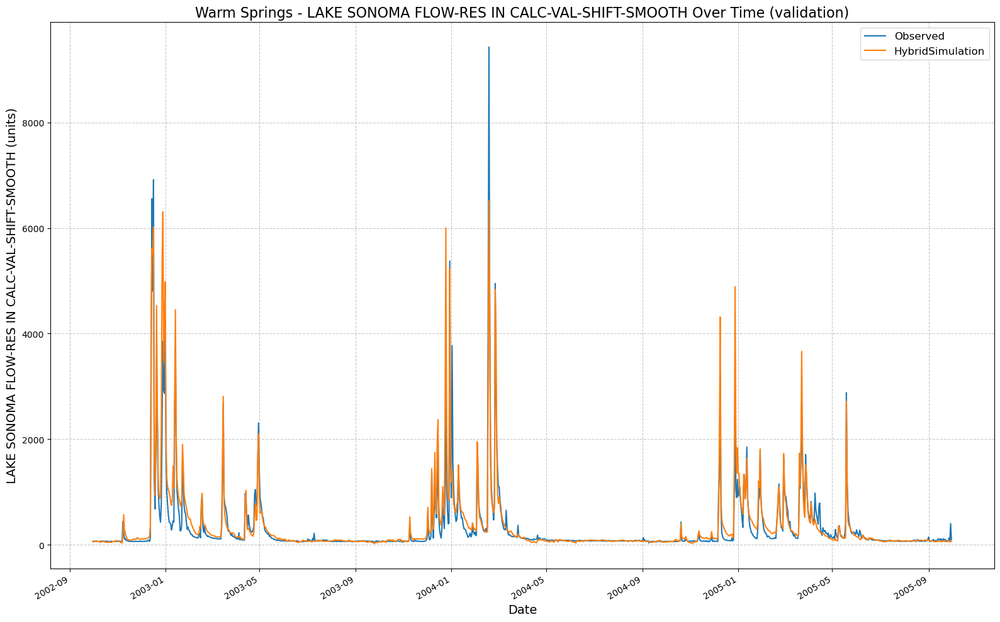

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013010/results_output_validation.csv
Physics: {'hidden_size': 128, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:30:56,366: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013056/output.log initialized.
2025-02-13 01:30:56,367: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013056
2025-02-13 01:30:56,368: ### Run configurations for testing_run
2025-02-13 01:30:56,368: experiment_name: testing_run
2025-02-13 01:30:56,369: train_basin_file: warm springs
2025-02-13 01:30:56,369: validation_basin_file: warm springs
2025-02-13 01:30:56,370: test_basin_file: warm springs
2025-02-13 01:30:56,370: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:30:56,371: tra

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.14it/s]
2025-02-13 01:30:56,566: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 909.83it/s]
2025-02-13 01:30:56,575: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:02<00:00,  4.34it/s, Loss: 0.0000]
2025-02-13 01:30:59,298: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:02<00:00,  4.32it/s, Loss: 0.0000]
2025-02-13 01:31:01,850: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:02<00:00,  4.25it/s, Loss: 0.0000]
2025-02-13 01:31:04,442: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:02<00:00,  4.27it/s, Loss: 0.0000]
2025-02-13 01:31:07,022: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:02<00:00,  4.30it/s, Loss: 0.0000]
2025-02-13 01:31:09,586: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]
2025-02-13 01:32:28,511: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013056/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:32:28,512: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013056/validation/model_epoch032/validation_results.p
got predictions


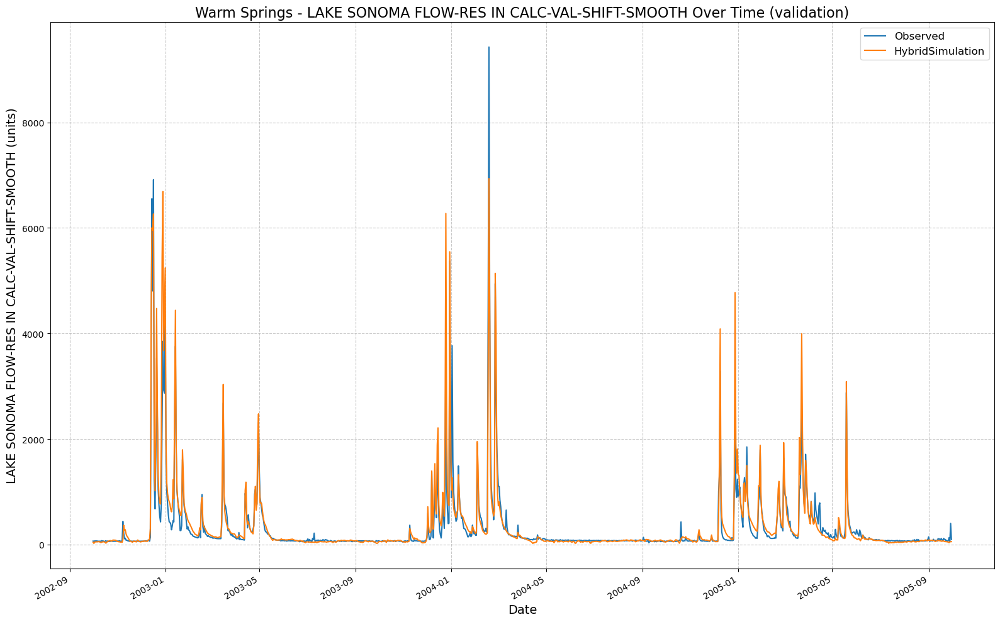

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013056/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:32:28,753: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013228/output.log initialized.
2025-02-13 01:32:28,753: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013228
2025-02-13 01:32:28,754: ### Run configurations for testing_run
2025-02-13 01:32:28,754: experiment_name: testing_run
2025-02-13 01:32:28,755: train_basin_file: warm springs
2025-02-13 01:32:28,755: validation_basin_file: warm springs
2025-02-13 01:32:28,756: test_basin_file: warm springs
2025-02-13 01:32:28,756: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:32:28,757: trai

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  5.99it/s]
2025-02-13 01:32:28,959: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 908.25it/s]
2025-02-13 01:32:28,967: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:03<00:00,  3.02it/s, Loss: 0.0000]
2025-02-13 01:32:33,112: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:09<00:00,  1.22it/s, Loss: 0.0000]
2025-02-13 01:32:42,980: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:06<00:00,  1.86it/s, Loss: 0.0000]
2025-02-13 01:32:49,444: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:06<00:00,  1.81it/s, Loss: 0.0000]
2025-02-13 01:32:56,090: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:05<00:00,  2.24it/s, Loss: 0.0000]
2025-02-13 01:33:01,469: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]
2025-02-13 01:33:59,058: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013228/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:33:59,061: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013228/validation/model_epoch016/validation_results.p
got predictions


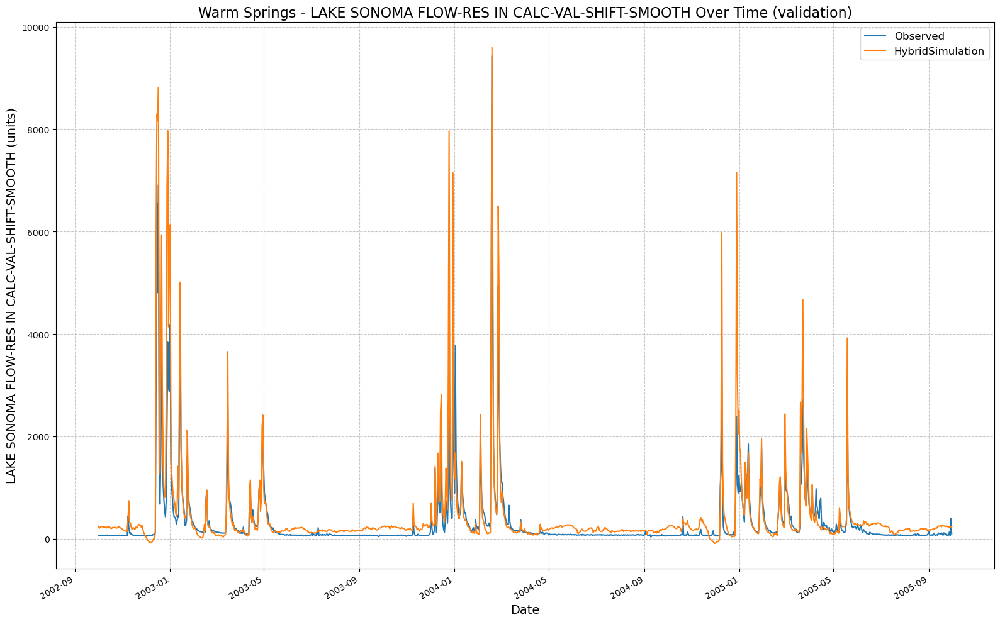

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013228/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:33:59,342: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013359/output.log initialized.
2025-02-13 01:33:59,343: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013359
2025-02-13 01:33:59,343: ### Run configurations for testing_run
2025-02-13 01:33:59,343: experiment_name: testing_run
2025-02-13 01:33:59,344: train_basin_file: warm springs
2025-02-13 01:33:59,344: validation_basin_file: warm springs
2025-02-13 01:33:59,344: test_basin_file: warm springs
2025-02-13 01:33:59,344: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:33:59,345: trai

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  5.29it/s]
2025-02-13 01:33:59,556: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 807.06it/s]
2025-02-13 01:33:59,565: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:03<00:00,  3.94it/s, Loss: 0.0000]
2025-02-13 01:34:02,777: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:02<00:00,  4.14it/s, Loss: 0.0000]
2025-02-13 01:34:05,680: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:02<00:00,  4.01it/s, Loss: 0.0000]
2025-02-13 01:34:08,678: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:02<00:00,  4.26it/s, Loss: 0.0000]
2025-02-13 01:34:11,498: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:02<00:00,  4.34it/s, Loss: 0.0000]
2025-02-13 01:34:14,266: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.38it/s]
2025-02-13 01:35:34,447: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013359/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:35:34,448: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013359/validation/model_epoch032/validation_results.p
got predictions


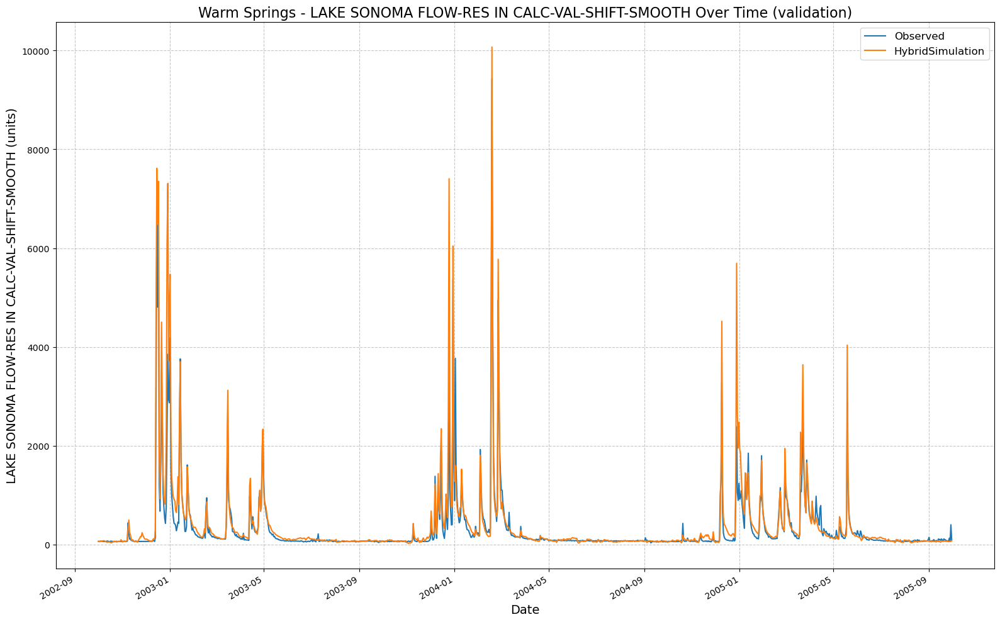

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013359/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:35:34,694: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013534/output.log initialized.
2025-02-13 01:35:34,695: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013534
2025-02-13 01:35:34,695: ### Run configurations for testing_run
2025-02-13 01:35:34,695: experiment_name: testing_run
2025-02-13 01:35:34,696: train_basin_file: warm springs
2025-02-13 01:35:34,696: validation_basin_file: warm springs
2025-02-13 01:35:34,696: test_basin_file: warm springs
2025-02-13 01:35:34,696: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:35:34,697: trai

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  5.96it/s]
2025-02-13 01:35:34,882: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1031.05it/s]
2025-02-13 01:35:34,889: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:02<00:00,  4.51it/s, Loss: 0.0000]
2025-02-13 01:35:37,722: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:02<00:00,  4.38it/s, Loss: 0.0000]
2025-02-13 01:35:40,462: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:02<00:00,  4.55it/s, Loss: 0.0000]
2025-02-13 01:35:43,099: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:02<00:00,  4.12it/s, Loss: 0.0000]
2025-02-13 01:35:46,013: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:02<00:00,  4.77it/s, Loss: 0.0000]
2025-02-13 01:35:48,533: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]
2025-02-13 01:36:22,817: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013534/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:36:22,820: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013534/validation/model_epoch016/validation_results.p
got predictions


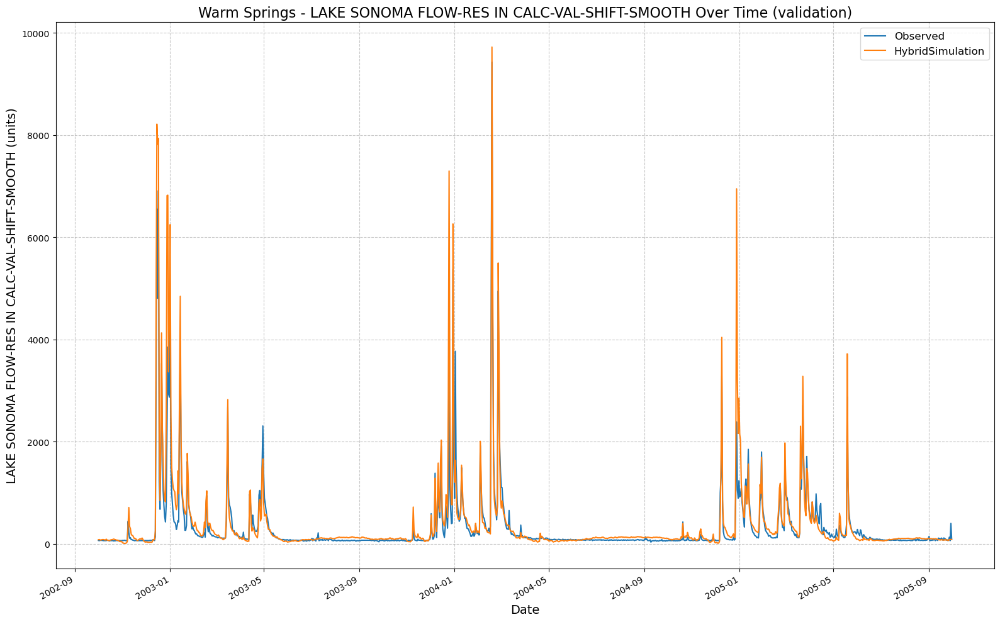

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013534/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 90, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:36:23,106: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013623/output.log initialized.
2025-02-13 01:36:23,106: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013623
2025-02-13 01:36:23,107: ### Run configurations for testing_run
2025-02-13 01:36:23,108: experiment_name: testing_run
2025-02-13 01:36:23,108: train_basin_file: warm springs
2025-02-13 01:36:23,109: validation_basin_file: warm springs
2025-02-13 01:36:23,109: test_basin_file: warm springs
2025-02-13 01:36:23,110: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:36:23,110: trai

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  4.59it/s]
2025-02-13 01:36:23,357: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 951.52it/s]
2025-02-13 01:36:23,364: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 12/12 [00:02<00:00,  4.40it/s, Loss: 0.0000]
2025-02-13 01:36:26,243: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 12/12 [00:03<00:00,  3.99it/s, Loss: 0.0000]
2025-02-13 01:36:29,250: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 12/12 [00:02<00:00,  4.03it/s, Loss: 0.0000]
2025-02-13 01:36:32,233: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 12/12 [00:02<00:00,  4.13it/s, Loss: 0.0000]
2025-02-13 01:36:35,143: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 12/12 [00:02<00:00,  4.25it/s, Loss: 0.0000]
2025-02-13 01:36:37,970: Epoch 5 averag

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]
2025-02-13 01:38:03,223: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013623/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:38:03,223: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013623/validation/model_epoch032/validation_results.p
got predictions


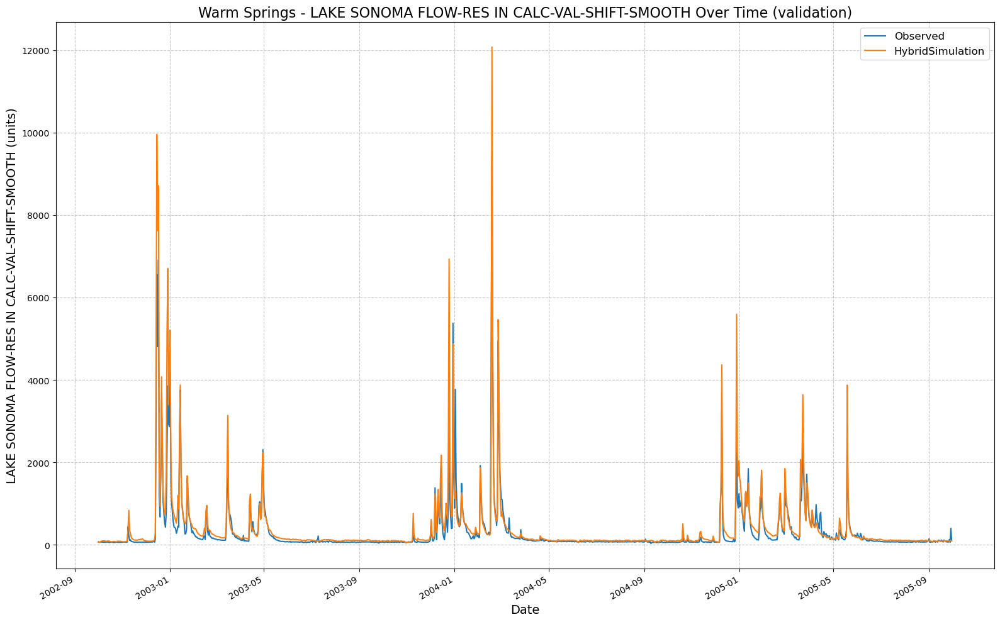

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013623/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:38:03,539: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013803/output.log initialized.
2025-02-13 01:38:03,539: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013803
2025-02-13 01:38:03,539: ### Run configurations for testing_run
2025-02-13 01:38:03,540: experiment_name: testing_run
2025-02-13 01:38:03,540: train_basin_file: warm springs
2025-02-13 01:38:03,540: validation_basin_file: warm springs
2025-02-13 01:38:03,541: test_basin_file: warm springs
2025-02-13 01:38:03,541: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:38:03,541: tra

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  4.86it/s]
2025-02-13 01:38:03,782: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1113.43it/s]
2025-02-13 01:38:03,789: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:04<00:00,  2.23it/s, Loss: 0.0000]
2025-02-13 01:38:08,872: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:05<00:00,  2.01it/s, Loss: 0.0000]
2025-02-13 01:38:14,339: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:05<00:00,  1.91it/s, Loss: 0.0000]
2025-02-13 01:38:20,118: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:05<00:00,  2.10it/s, Loss: 0.0000]
2025-02-13 01:38:25,366: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:05<00:00,  2.09it/s, Loss: 0.0000]
2025-02-13 01:38:30,649: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.23s/it]
2025-02-13 01:39:38,451: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013803/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:39:38,452: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013803/validation/model_epoch016/validation_results.p
got predictions


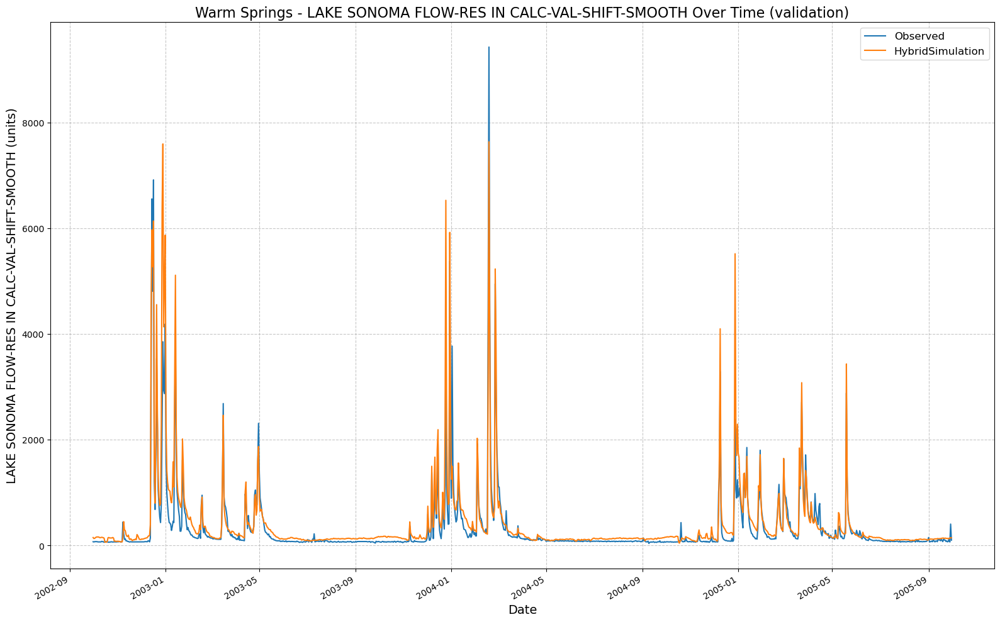

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013803/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 1, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:39:38,688: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013938/output.log initialized.
2025-02-13 01:39:38,688: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013938
2025-02-13 01:39:38,689: ### Run configurations for testing_run
2025-02-13 01:39:38,689: experiment_name: testing_run
2025-02-13 01:39:38,689: train_basin_file: warm springs
2025-02-13 01:39:38,690: validation_basin_file: warm springs
2025-02-13 01:39:38,690: test_basin_file: warm springs
2025-02-13 01:39:38,690: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:39:38,691: tra

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.41it/s]
2025-02-13 01:39:38,866: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1280.31it/s]
2025-02-13 01:39:38,873: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:05<00:00,  2.19it/s, Loss: 0.0000]
2025-02-13 01:39:44,055: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:05<00:00,  2.16it/s, Loss: 0.0000]
2025-02-13 01:39:49,140: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:05<00:00,  2.04it/s, Loss: 0.0000]
2025-02-13 01:39:54,529: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:06<00:00,  1.81it/s, Loss: 0.0000]
2025-02-13 01:40:00,634: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:04<00:00,  2.27it/s, Loss: 0.0000]
2025-02-13 01:40:05,493: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.39s/it]
2025-02-13 01:42:33,761: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013938/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:42:33,763: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013938/validation/model_epoch032/validation_results.p
got predictions


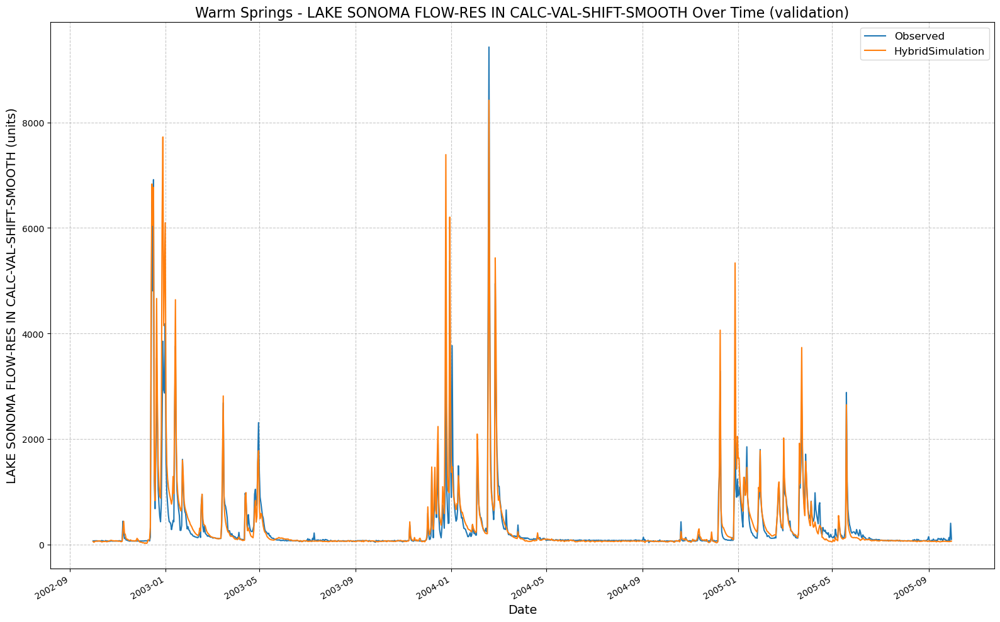

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_013938/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 2, 'epochs': 16, 'output_dropout': 0.4, 'save_weights_every': 16}
2025-02-13 01:42:33,996: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_014233/output.log initialized.
2025-02-13 01:42:33,997: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_014233
2025-02-13 01:42:33,997: ### Run configurations for testing_run
2025-02-13 01:42:33,998: experiment_name: testing_run
2025-02-13 01:42:33,998: train_basin_file: warm springs
2025-02-13 01:42:33,999: validation_basin_file: warm springs
2025-02-13 01:42:33,999: test_basin_file: warm springs
2025-02-13 01:42:33,999: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:42:34,000: tra

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.31it/s]
2025-02-13 01:42:34,177: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1159.61it/s]
2025-02-13 01:42:34,184: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:04<00:00,  2.22it/s, Loss: 0.0000]
2025-02-13 01:42:39,315: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:04<00:00,  2.32it/s, Loss: 0.0000]
2025-02-13 01:42:44,062: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:04<00:00,  2.29it/s, Loss: 0.0000]
2025-02-13 01:42:48,874: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:04<00:00,  2.28it/s, Loss: 0.0000]
2025-02-13 01:42:53,703: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:05<00:00,  2.16it/s, Loss: 0.0000]
2025-02-13 01:42:58,798: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.33s/it]
2025-02-13 01:44:00,248: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_014233/validation/model_epoch016/validation_metrics.csv
2025-02-13 01:44:00,250: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_014233/validation/model_epoch016/validation_results.p
got predictions


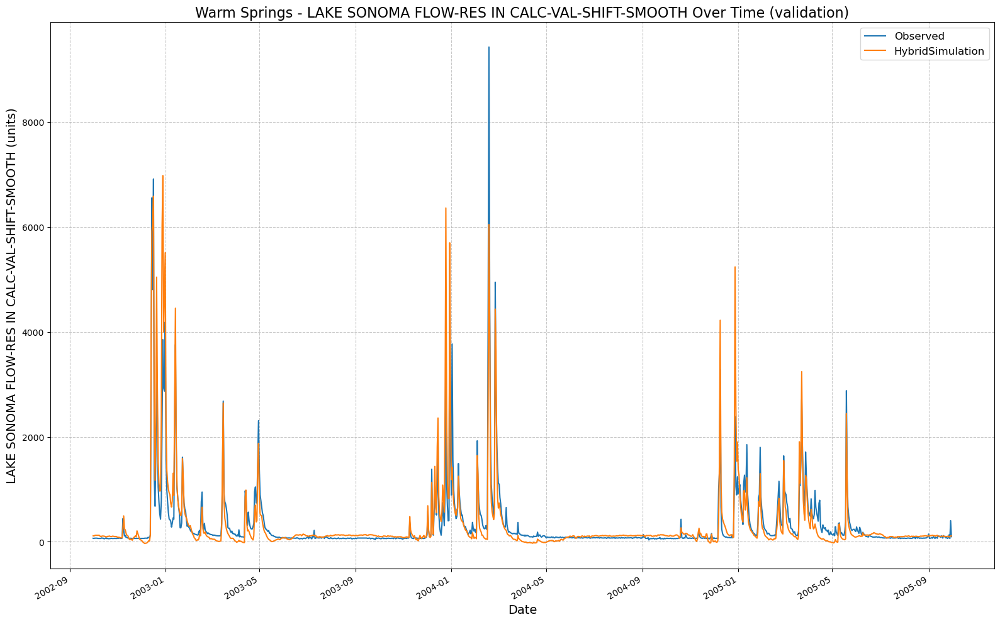

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_014233/results_output_validation.csv
Physics: {'hidden_size': 256, 'seq_length': 180, 'num_layers': 2, 'epochs': 32, 'output_dropout': 0.4, 'save_weights_every': 32}
2025-02-13 01:44:00,480: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_014400/output.log initialized.
2025-02-13 01:44:00,480: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_014400
2025-02-13 01:44:00,481: ### Run configurations for testing_run
2025-02-13 01:44:00,481: experiment_name: testing_run
2025-02-13 01:44:00,481: train_basin_file: warm springs
2025-02-13 01:44:00,482: validation_basin_file: warm springs
2025-02-13 01:44:00,483: test_basin_file: warm springs
2025-02-13 01:44:00,483: train_start_date: 1994-10-01 00:00:00
2025-02-13 01:44:00,483: tra

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


100%|██████████| 1/1 [00:00<00:00,  6.12it/s]
2025-02-13 01:44:00,667: Calculating target variable stds per basin
100%|██████████| 1/1 [00:00<00:00, 1102.60it/s]
2025-02-13 01:44:00,673: Create lookup table and convert to pytorch tensor
# Epoch 1: 100%|██████████| 11/11 [00:05<00:00,  2.10it/s, Loss: 0.0000]
2025-02-13 01:44:06,104: Epoch 1 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 2: 100%|██████████| 11/11 [00:05<00:00,  2.18it/s, Loss: 0.0000]
2025-02-13 01:44:11,158: Epoch 2 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 3: 100%|██████████| 11/11 [00:04<00:00,  2.20it/s, Loss: 0.0000]
2025-02-13 01:44:16,162: Epoch 3 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 4: 100%|██████████| 11/11 [00:05<00:00,  2.14it/s, Loss: 0.0000]
2025-02-13 01:44:21,312: Epoch 4 average loss: avg_loss: 0.00000, avg_total_loss: 0.00000
# Epoch 5: 100%|██████████| 11/11 [00:04<00:00,  2.24it/s, Loss: 0.0000]
2025-02-13 01:44:26,232: Epoch 5 avera

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:01<00:00,  1.16s/it]
2025-02-13 01:46:53,953: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_014400/validation/model_epoch032/validation_metrics.csv
2025-02-13 01:46:53,954: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_014400/validation/model_epoch032/validation_results.p
got predictions


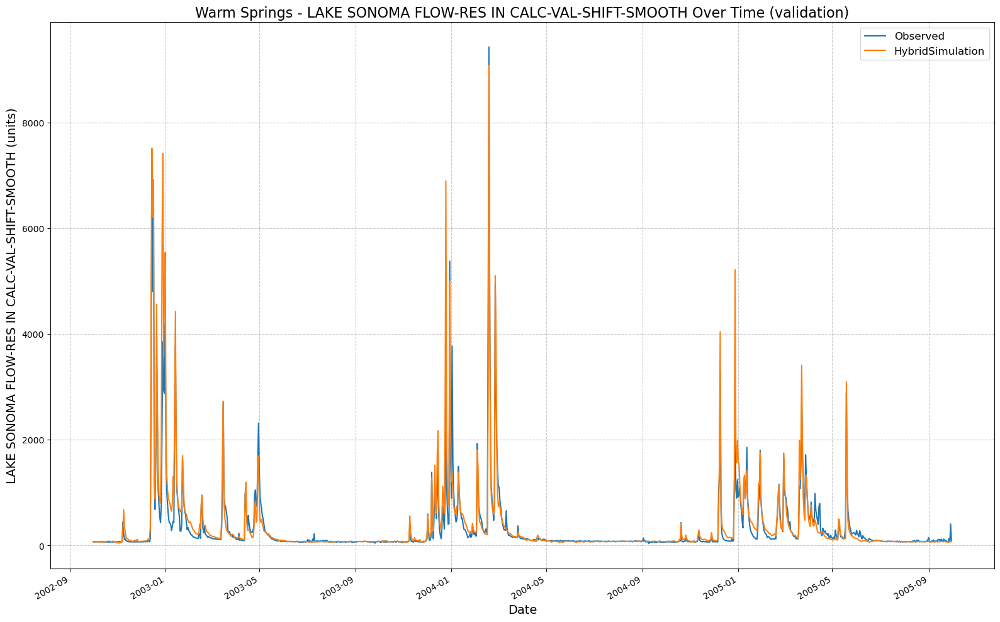

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_014400/results_output_validation.csv


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


In [9]:
for (hs, seq, nl, ep) in itertools.product(
        hyperparam_space["hidden_size"],
        hyperparam_space["seq_length"],
        hyperparam_space["num_layers"],
        hyperparam_space["epochs"]
):
    hp = {
        "hidden_size": hs,
        "seq_length": seq,
        "num_layers": nl,
        "epochs": ep,
        "output_dropout": fixed_dropout,
    }
    print(f"Physics: {hp}")
    trainer = UCB_trainer(
        path_to_csv_folder=path_to_csv,
        yaml_path=path_to_yaml,
        hyperparams=hp,
        input_features=features_with_physics,
        physics_informed=True,
        physics_data_file=path_to_physics_data,
        hourly=False,
        extend_train_period=False,
        gpu=-1
    )
    trainer.train()
    csv_path, metrics_dict = trainer.results()
    row_data = {"hidden_size": hs, "seq_length": seq, "num_layers": nl, "epochs": ep, "output_dropout": fixed_dropout}
    for k, v in metrics_dict.items():
        row_data[k] = v
    physics_results.append(row_data)

In [10]:
df_no_physics = pd.DataFrame(no_physics_results)
df_physics = pd.DataFrame(physics_results)
df_no_physics.sort_values(by="NSE", ascending=False, inplace=True)
df_physics.sort_values(by="NSE", ascending=False, inplace=True)
df_no_physics.reset_index(drop=True, inplace=True)
df_physics.reset_index(drop=True, inplace=True)

In [ ]:
best_no_phys = df_no_physics.iloc[0].to_dict()
best_phys = df_physics.iloc[0].to_dict()

In [11]:
df_no_physics

,hidden_size,seq_length,num_layers,epochs,output_dropout,NSE,MSE,RMSE,KGE,Alpha-NSE,Beta-KGE,Beta-NSE,Pearson-r,FHV,FMS,FLV,Peak-Timing,Peak-MAPE
0,64,90,1,16,0.4,0.861032,68138.601562,261.033717,0.848754,0.945842,1.122534,0.056956,0.929803,-3.687317,-30.176659,-2511.101719,0.2,22.301273
1,64,90,2,32,0.4,0.843310,76827.835938,277.178347,0.885245,1.056847,1.068820,0.031989,0.927882,8.303317,6.078320,-2718.050850,0.2,20.566344
2,64,180,1,32,0.4,0.839573,78660.437500,280.464681,0.909876,1.040657,1.025696,0.011944,0.923783,7.522120,17.469474,-2682.690658,0.2,26.977437
3,128,180,1,32,0.4,0.835563,80626.390625,283.947866,0.917939,1.012092,1.000461,0.000214,0.918836,4.914128,9.987349,-2735.110002,0.2,28.458450
4,128,90,2,32,0.4,0.834706,81046.570312,284.686793,0.864986,1.098555,1.059587,0.027697,0.929538,12.000000,9.225101,-2746.340723,0.2,28.173368
5,64,180,2,16,0.4,0.833686,81546.820312,285.564039,0.874745,0.916921,1.035439,0.016473,0.913220,-5.900319,-8.417136,-2728.303243,0.2,38.445346
6,128,90,1,32,0.4,0.829858,83423.851562,288.831874,0.842448,1.098014,1.100075,0.046517,0.927883,12.005834,-9.645511,-4.272621,0.2,31.834617
7,64,180,2,32,0.4,0.828177,84248.187500,290.255383,0.905917,0.972318,0.981169,-0.008753,0.912076,-0.104741,5.705335,-2709.058013,0.4,33.156157
8,128,180,2,32,0.4,0.823752,86417.718750,293.968908,0.845405,1.073497,1.111185,0.051681,0.921669,11.155295,-7.997655,-2812.572686,0.2,21.683838
9,128,180,1,16,0.4,0.822109,87223.062500,295.335508,0.901643,0.989904,0.960782,-0.018229,0.910367,-0.286550,61.694394,-1781.103640,0.4,37.072766


In [12]:
df_physics 

,hidden_size,seq_length,num_layers,epochs,output_dropout,NSE,MSE,RMSE,KGE,Alpha-NSE,Beta-KGE,Beta-NSE,Pearson-r,FHV,FMS,FLV,Peak-Timing,Peak-MAPE
0,64,90,1,16,0.4,0.884292,56733.730469,238.188435,0.851717,1.111589,1.086286,0.040107,0.954278,14.949958,27.091932,-2315.880828,0.0,14.931082
1,64,180,1,32,0.4,0.875121,61230.363281,247.447698,0.872905,1.103368,1.053093,0.024679,0.948528,16.226269,-0.185803,-183.806897,0.0,16.024964
2,64,180,2,32,0.4,0.871078,63212.933594,251.421824,0.873576,1.086263,1.073997,0.034395,0.944628,12.805592,0.893671,-2709.047748,0.0,17.694556
3,64,90,2,16,0.4,0.868918,64272.027344,253.519284,0.861032,1.126097,1.028354,0.013180,0.948935,17.727201,19.039957,-2466.860416,0.0,15.979506
4,128,90,2,32,0.4,0.868764,64347.554688,253.668198,0.759513,1.189114,1.143546,0.066723,0.961728,22.636794,4.975883,-2780.904740,0.0,18.411350
5,64,90,1,32,0.4,0.865598,65899.992188,256.709938,0.765306,1.184908,1.138735,0.064486,0.959468,23.201863,8.123832,-2730.084908,0.0,16.875000
6,128,180,2,32,0.4,0.858226,69514.500000,263.656026,0.835684,1.117314,1.100329,0.046635,0.943688,15.924372,11.308206,-38.394102,0.0,14.961164
7,128,180,1,32,0.4,0.854336,71421.796875,267.248568,0.827743,1.133859,1.093130,0.043289,0.944494,19.371964,-1.770405,-17.940628,0.0,18.722454
8,128,180,2,16,0.4,0.851874,72628.992188,269.497666,0.828808,1.083754,1.135232,0.062858,0.936720,11.682636,6.550052,-40.726121,0.0,17.982403
9,64,180,2,16,0.4,0.850448,73327.906250,270.791260,0.871072,1.101629,1.048269,0.022436,0.937039,14.596674,9.279691,-222.950442,0.0,19.942508


2025-02-13 02:09:18,646: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_020918/output.log initialized.
2025-02-13 02:09:18,647: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_020918
2025-02-13 02:09:18,647: ### Run configurations for testing_run
2025-02-13 02:09:18,648: experiment_name: testing_run
2025-02-13 02:09:18,648: train_basin_file: warm springs
2025-02-13 02:09:18,649: validation_basin_file: warm springs
2025-02-13 02:09:18,649: test_basin_file: warm springs
2025-02-13 02:09:18,649: train_start_date: 1994-10-01 00:00:00
2025-02-13 02:09:18,650: train_end_date: 2005-09-30 00:00:00
2025-02-13 02:09:18,650: validation_start_date: 2002-10-01 00:00:00
2025-02-13 02:09:18,650: validation_end_date: 2005-09-30 00:00:00
2025-02-13 02:09:18,651: test_start_date: 2005-10-01 00:00:00
2025-02-13 02:09:18,651: test_end_date: 2009-09-29 00:00:00
202

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]
2025-02-13 02:09:38,582: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_020918/validation/model_epoch016/validation_metrics.csv
2025-02-13 02:09:38,582: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_020918/validation/model_epoch016/validation_results.p
2025-02-13 02:09:38,592: Using the model weights from /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_020918/model_epoch016.pt


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Evaluation: 100%|██████████| 1/1 [00:00<00:00,  3.19it/s]
2025-02-13 02:09:38,909: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_020918/test/model_epoch016/test_metrics.csv
2025-02-13 02:09:38,911: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_020918/test/model_epoch016/test_results.p
got predictions


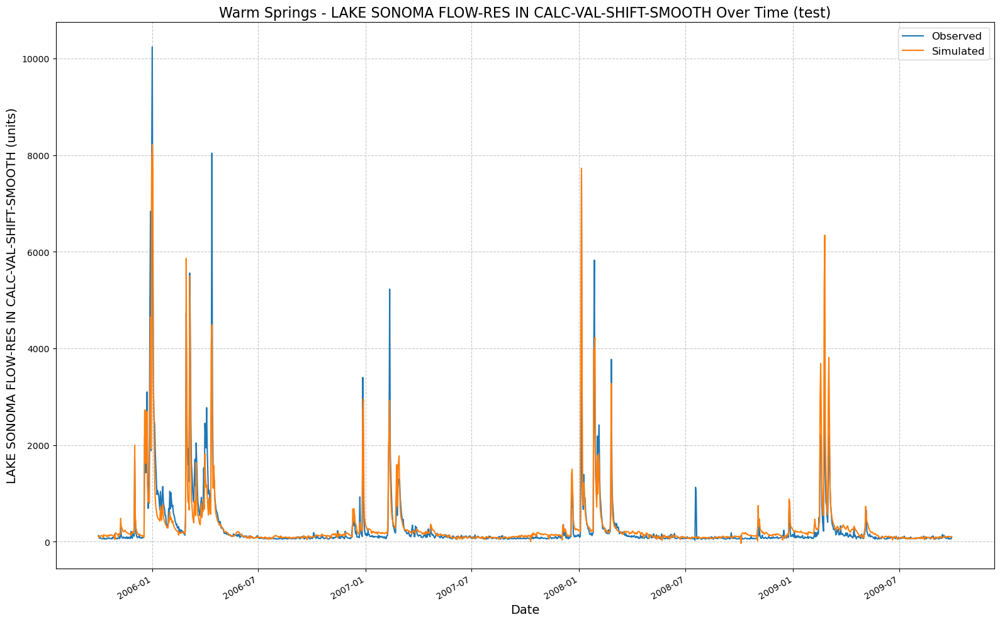

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_020918/results_output_test.csv


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


{'NSE': 0.8296737968921661,
 'MSE': 91207.1484375,
 'RMSE': 302.0052125998821,
 'KGE': 0.8855386967168871,
 'Alpha-NSE': 0.9620376787352799,
 'Beta-KGE': 1.0633749961853027,
 'Beta-NSE': 0.025779467357126253,
 'Pearson-r': 0.9125708173892962,
 'FHV': 2.3593056946992874,
 'FMS': -1.484715671883546,
 'FLV': -2269.1008706825164,
 'Peak-Timing': 0.16666666666666666,
 'Peak-MAPE': 51.1730432510376}

In [15]:
best_no_physics_params = {
    "epochs": int(best_no_phys["epochs"]),
    "hidden_size": int(best_no_phys["hidden_size"]),
    "seq_length": int(best_no_phys["seq_length"]),
    "num_layers": int(best_no_phys["num_layers"]),
    "output_dropout": fixed_dropout,
}

lstmNoPhysicsExtBest = UCB_trainer(
    path_to_csv_folder=path_to_csv,
    yaml_path=path_to_yaml,
    hyperparams=best_no_physics_params,
    input_features=None,
    physics_informed=False,
    physics_data_file=None,
    hourly=False,
    extend_train_period=True,  
    gpu=-1
)

lstmNoPhysicsExtBest.train()
no_physics_test_csv, no_physics_test_metrics = lstmNoPhysicsExtBest.results('test')
no_physics_test_metrics

2025-02-13 02:09:39,153: Logging to /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_020939/output.log initialized.
2025-02-13 02:09:39,153: ### Folder structure created at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_020939
2025-02-13 02:09:39,153: ### Run configurations for testing_run
2025-02-13 02:09:39,154: experiment_name: testing_run
2025-02-13 02:09:39,154: train_basin_file: warm springs
2025-02-13 02:09:39,154: validation_basin_file: warm springs
2025-02-13 02:09:39,154: test_basin_file: warm springs
2025-02-13 02:09:39,155: train_start_date: 1994-10-01 00:00:00
2025-02-13 02:09:39,155: train_end_date: 2005-09-30 00:00:00
2025-02-13 02:09:39,155: validation_start_date: 2002-10-01 00:00:00
2025-02-13 02:09:39,155: validation_end_date: 2005-09-30 00:00:00
2025-02-13 02:09:39,156: test_start_date: 2005-10-01 00:00:00
2025-02-13 02:09:39,156: test_end_date: 2009-09-29 00:00:00
202

/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Validation: 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]
2025-02-13 02:09:59,613: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_020939/validation/model_epoch016/validation_metrics.csv
2025-02-13 02:09:59,614: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_020939/validation/model_epoch016/validation_results.p
2025-02-13 02:09:59,627: Using the model weights from /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_020939/model_epoch016.pt


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/evaluation/tester.py:133: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

# Evaluation: 100%|██████████| 1/1 [00:00<00:00,  2.70it/s]
2025-02-13 02:10:00,002: Stored metrics at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_020939/test/model_epoch016/test_metrics.csv
2025-02-13 02:10:00,003: Stored results at /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_020939/test/model_epoch016/test_results.p
got predictions


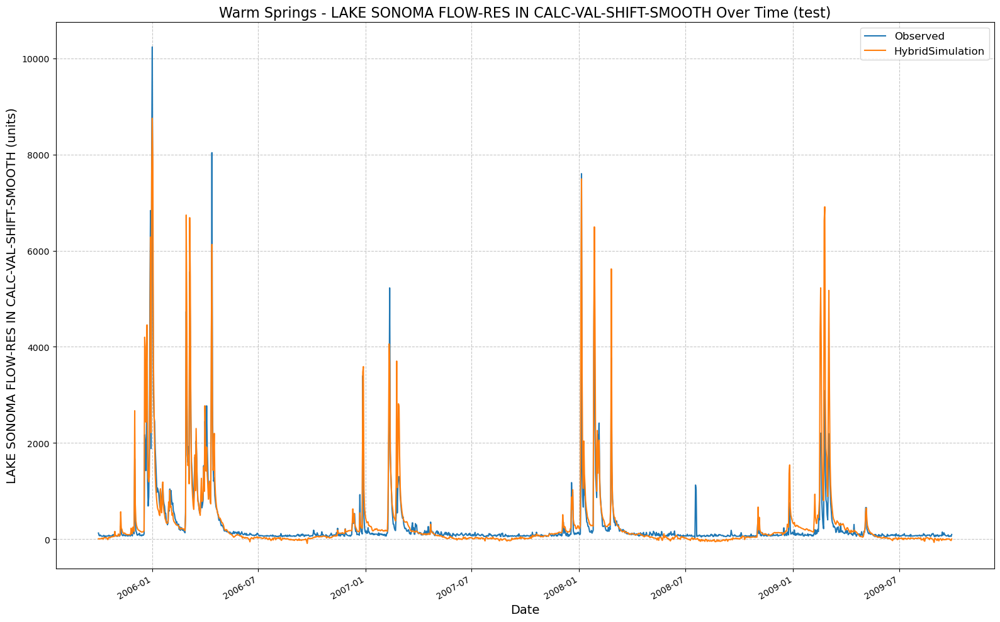

[INFO] CSV output saved at: /Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/runs/testing_run_1302_020939/results_output_test.csv


/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:339: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  offset_one = to_offset(freq_one)
/Users/canruso/Desktop/UCB-USACE-LSTMs/UCB_training/models/warm_springs_all/../../../../UCB-USACE-LSTMs/neuralhydrology/datautils/utils.py:382: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  factor = pd.to_timedelta(freq_one) / pd.to_timedelta(freq_two)


{'NSE': 0.765258863568306,
 'MSE': 125700.3828125,
 'RMSE': 354.5424978934119,
 'KGE': 0.7514271810056483,
 'Alpha-NSE': 1.2025633003536735,
 'Beta-KGE': 1.1201200485229492,
 'Beta-NSE': 0.048861990294853525,
 'Pearson-r': 0.9204529721770164,
 'FHV': 25.32080113887787,
 'FMS': 155.41757655286673,
 'FLV': -1076.1669896617666,
 'Peak-Timing': 0.5,
 'Peak-MAPE': 49.031829833984375}

In [16]:
best_physics_params = {
    "epochs": int(best_phys["epochs"]),
    "hidden_size": int(best_phys["hidden_size"]),
    "seq_length": int(best_phys["seq_length"]),
    "num_layers": int(best_phys["num_layers"]),
    "output_dropout": fixed_dropout,
}

lstmPhysicsExtBest = UCB_trainer(
    path_to_csv_folder=path_to_csv,
    yaml_path=path_to_yaml,
    hyperparams=best_physics_params,
    input_features=features_with_physics,
    physics_informed=True,
    physics_data_file=path_to_physics_data,
    hourly=False,
    extend_train_period=True,
    gpu=-1
)

lstmPhysicsExtBest.train()
physics_test_csv, physics_test_metrics = lstmPhysicsExtBest.results('test')
physics_test_metrics

In [14]:
fancyCombinedPlot(lstm_results=no_physics_test_csv, lstmPhysics_results= physics_test_csv, HMS_results=path_to_physics_data, title='Warm Springs Basin Daily Model Comparison', fName = "warm_springs_daily_metrics.csv")